In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/otsudataset/tiger1.bmp
/kaggle/input/otsudataset/data13 (1).bmp
/kaggle/input/otsudataset/basket_balls.bmp


In [ ]:
def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R,G,B) tuples or similar structure)
    to a 2D greyscale image using the formula:
       I = Round(0.299*R + 0.587*G + 0.114*B).
    Returns a 2D list (same height and width), each element in [0..255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0]*width for _ in range(height)]
    
    for r in range(height):
        for c in range(width):
            (red, green, blue) = rgb_image[r][c]
            grey_val = int(round(0.299*red + 0.587*green + 0.114*blue))
            if grey_val < 0: 
                grey_val = 0
            elif grey_val > 255:
                grey_val = 255
            grey_image[r][c] = grey_val
    
    return grey_image


def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] = number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0]*256
    height = len(grey_image)
    width = len(grey_image[0])
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    
    return hist


def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j),
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist


def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums P(k) = sum_{j=0..k} H(j)
    and cumulative intensities S(k) = sum_{j=0..k} j*H(j)
    for all k in [0..255].
    
    Returns P, S (each length 256).
    """
    P = [0]*256
    S = [0]*256
    
    P[0] = norm_hist[0]
    S[0] = 0.0*norm_hist[0]  # which is 0 anyway
    for k in range(1, 256):
        P[k] = P[k-1] + norm_hist[k]
        S[k] = S[k-1] + k*norm_hist[k]
    
    return P, S


def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g..end_g].
    Using cumulative sums P and S for efficiency.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        # Edge case: no pixels in this region; avoid division by zero
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    
    # To compute variance:
    #   variance = (1/omega) * sum_{g=start_g..end_g} (g - mean_val)^2 * H(g)
    # We expand: (g - mean)^2 = g^2 - 2*g*mean + mean^2.
    # So sum_{g} (g^2 * H(g)) can be found if we had a second cumulative array
    # for g^2 * H(g). For demonstration, we'll do a direct loop, which is slower but simpler:
    
    # If speed is a concern, create a second array T(k) = sum_{j=0..k} j^2 * H(j).
    # Then the sum of j^2 * H(j) from [start_g..end_g] is T[end_g] - T[start_g-1].
    
    var_numer = 0.0
    # We do a simple loop here; for large images, you might precompute T(k).
    for g in range(start_g, end_g+1):
        # We can get H(g) via difference from P. But let's do it directly:
        #   H(g) = P(g) - P(g-1), except for g=0
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g-1]
        diff = (g - mean_val)
        var_numer += (diff * diff) * h_g
    
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)


def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalised histogram (length 256) and a target number of regions N,
    return the thresholds that minimise the total within-class variance.
    
    For N=2, we return a single threshold t.
    For N=3, we return t1, t2.
    For N=4, we return t1, t2, t3.
    
    This naive implementation uses brute force for up to N=4.
    """
    # Prepare cumulative sums for fast region stats
    P, S = prepare_cumulative_arrays(norm_hist)
    
    best_thresholds = None
    min_variance = float("inf")
    
    if N == 2:
        # Single threshold
        for t in range(0, 255):
            # Region1: [0..t], Region2: [t+1..255]
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t+1, 255)
            total_var = w1*v1 + w2*v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
    
    elif N == 3:
        # Two thresholds t1 < t2
        for t1 in range(0, 254):
            for t2 in range(t1+1, 255):
                # Region1: [0..t1], Region2: [t1+1..t2], Region3: [t2+1..255]
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1+1, t2)
                w3, m3, v3 = region_stats(P, S, t2+1, 255)
                total_var = w1*v1 + w2*v2 + w3*v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
    
    elif N == 4:
        # Three thresholds t1 < t2 < t3
        for t1 in range(0, 253):
            for t2 in range(t1+1, 254):
                for t3 in range(t2+1, 255):
                    # Region1: [0..t1], Region2: [t1+1..t2], Region3: [t2+1..t3], Region4: [t3+1..255]
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1+1, t2)
                    w3, m3, v3 = region_stats(P, S, t2+1, t3)
                    w4, m4, v4 = region_stats(P, S, t3+1, 255)
                    total_var = w1*v1 + w2*v2 + w3*v3 + w4*v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
    
    return best_thresholds, min_variance


def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image with one unique output intensity (or colour)
    per region.
    """
    # Decide on region intensities. For up to 4 regions, we might just pick:
    # region 1 -> 64, region 2 -> 128, region 3 -> 192, region 4 -> 255
    # Or any pattern you like.
    region_values = [64, 128, 192, 255]
    
    height = len(grey_image)
    width = len(grey_image[0])
    
    out_image = [[0]*width for _ in range(height)]
    t_list = sorted(thresholds)
    # For safety, handle the case N=2, 3, or 4:
    #   Let t_list = (t1, t2, t3) or less if N<4.
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            # Find which region g belongs to
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            # Assign region intensity
            out_image[r][c] = region_values[region_idx]
    
    return out_image


def main_demo(rgb_image, N):
    """
    Demonstration of the entire flow:
     1) Convert to greyscale
     2) Compute histogram & normalise
     3) Multi-threshold Otsu
     4) Apply thresholds
    """
    # 1) Convert
    grey_image = convert_to_greyscale(rgb_image)
    
    # 2) Histogram & normalise
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)
    
    # 3) Multi-threshold Otsu
    thresholds, final_var = otsu_multi_threshold(norm_hist, N)
    
    print(f"Optimal thresholds for N={N}:", thresholds)
    print(f"Minimum within-group variance: {final_var}")
    
    # 4) Apply thresholds
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)
    
    return segmented_image


In [3]:
pip install pillow


Note: you may need to restart the kernel to use updated packages.


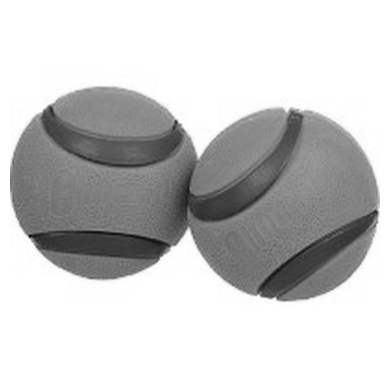

In [1]:
from PIL import Image
import numpy as np

# Load the BMP image
image = Image.open("/kaggle/input/otsudataset/basket_balls.bmp")  # Update the path

# Convert to grayscale
gray_image = image.convert("L")  # 'L' mode converts to grayscale

# Convert to NumPy array
gray_array = np.array(gray_image)

# Display the grayscale image
gray_image.show()  # Opens the image (works in local but might not work in Kaggle notebooks)

# To display in a Kaggle notebook
import matplotlib.pyplot as plt
plt.imshow(gray_array, cmap="gray")
plt.axis("off")  # Hide axes
plt.show()


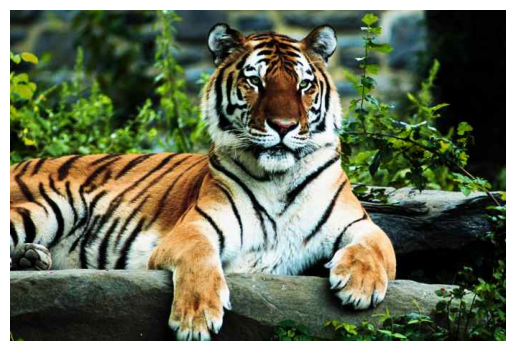

In [6]:
import cv2
import matplotlib.pyplot as plt

# Read BMP image using OpenCV (loads as BGR)
image_bgr = cv2.imread("/kaggle/input/otsudataset/tiger1.bmp")

# Convert from BGR to RGB
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the RGB image
plt.imshow(image_rgb)
plt.axis("off")  # Hide axis
plt.show()


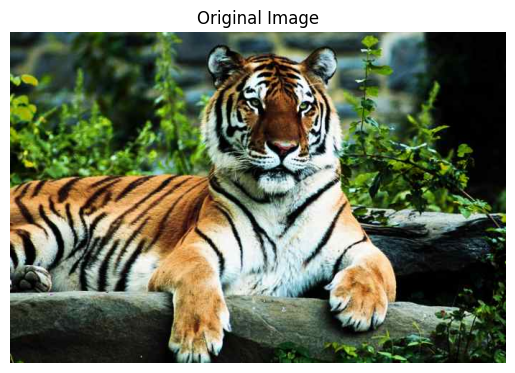

Optimal thresholds for N=4: (48, 109, 177)
Minimum within-group variance: 321.1087978231897


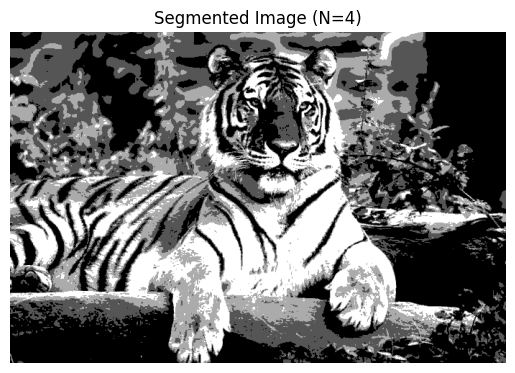

In [1]:
import cv2
import matplotlib.pyplot as plt

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR)
image_bgr = cv2.imread("/kaggle/input/otsudataset/tiger1.bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image
plt.imshow(image_rgb)
plt.axis("off")  # Hide axis
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples,
# as expected by the segmentation functions.
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R,G,B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B)
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j)
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    
    # Compute variance using a direct loop (for demonstration).
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalized histogram (length 256) and a target number of regions N,
    return the thresholds that minimize the total within-class variance.
    
    For N=2, returns a single threshold.
    For N=3, returns two thresholds.
    For N=4, returns three thresholds.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
    
    return best_thresholds, min_variance

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalize the histogram.
      3. Apply multi-threshold Otsu segmentation.
      4. Return the segmented image.
    """
    # 1. Convert to greyscale
    grey_image = convert_to_greyscale(rgb_image)
    
    # 2. Compute histogram & normalize
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)
    
    # 3. Find optimal thresholds via multi-threshold Otsu
    thresholds, final_var = otsu_multi_threshold(norm_hist, N)
    print(f"Optimal thresholds for N={N}:", thresholds)
    print(f"Minimum within-group variance: {final_var}")
    
    # 4. Apply thresholds to obtain segmented image
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)
    return segmented_image

# ------------------------------
# PART 3: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 4

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Display the segmented image
plt.imshow(segmented, cmap="gray")
plt.axis("off")
plt.title(f"Segmented Image (N={N})")
plt.show()


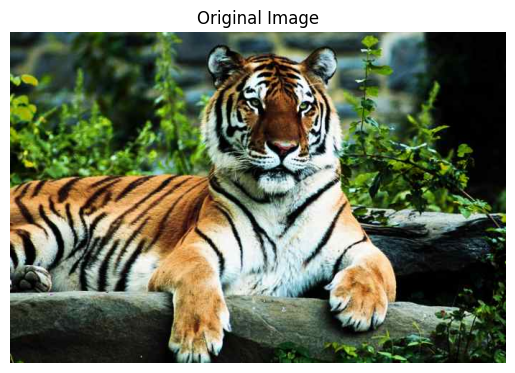

Optimal thresholds for N=2: (108,)
Minimum within-group variance: 1295.6351638032734


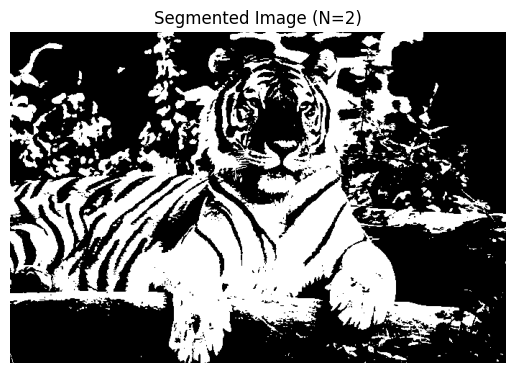

In [2]:
import cv2
import matplotlib.pyplot as plt

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR)
image_bgr = cv2.imread("/kaggle/input/otsudataset/tiger1.bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image
plt.imshow(image_rgb)
plt.axis("off")  # Hide axis
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples,
# as expected by the segmentation functions.
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R,G,B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B)
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j)
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    
    # Compute variance using a direct loop (for demonstration).
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalized histogram (length 256) and a target number of regions N,
    return the thresholds that minimize the total within-class variance.
    
    For N=2, returns a single threshold.
    For N=3, returns two thresholds.
    For N=4, returns three thresholds.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
    
    return best_thresholds, min_variance

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalize the histogram.
      3. Apply multi-threshold Otsu segmentation.
      4. Return the segmented image.
    """
    # 1. Convert to greyscale
    grey_image = convert_to_greyscale(rgb_image)
    
    # 2. Compute histogram & normalize
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)
    
    # 3. Find optimal thresholds via multi-threshold Otsu
    thresholds, final_var = otsu_multi_threshold(norm_hist, N)
    print(f"Optimal thresholds for N={N}:", thresholds)
    print(f"Minimum within-group variance: {final_var}")
    
    # 4. Apply thresholds to obtain segmented image
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)
    return segmented_image

# ------------------------------
# PART 3: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 2

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Display the segmented image
plt.imshow(segmented, cmap="gray")
plt.axis("off")
plt.title(f"Segmented Image (N={N})")
plt.show()


In [ ]:
import cv2
import matplotlib.pyplot as plt

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR)
image_bgr = cv2.imread("/kaggle/input/otsudataset/tiger1.bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image
plt.imshow(image_rgb)
plt.axis("off")  # Hide axis
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples,
# as expected by the segmentation functions.
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R,G,B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B)
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j)
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    
    # Compute variance using a direct loop (for demonstration).
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalized histogram (length 256) and a target number of regions N,
    return the thresholds that minimize the total within-class variance.
    
    For N=2, returns a single threshold.
    For N=3, returns two thresholds.
    For N=4, returns three thresholds.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
    
    return best_thresholds, min_variance

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalize the histogram.
      3. Apply multi-threshold Otsu segmentation.
      4. Return the segmented image.
    """
    # 1. Convert to greyscale
    grey_image = convert_to_greyscale(rgb_image)
    
    # 2. Compute histogram & normalize
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)
    
    # 3. Find optimal thresholds via multi-threshold Otsu
    thresholds, final_var = otsu_multi_threshold(norm_hist, N)
    print(f"Optimal thresholds for N={N}:", thresholds)
    print(f"Minimum within-group variance: {final_var}")
    
    # 4. Apply thresholds to obtain segmented image
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)
    return segmented_image

# ------------------------------
# PART 3: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 4

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Display the segmented image
plt.imshow(segmented, cmap="gray")
plt.axis("off")
plt.title(f"Segmented Image (N={N})")
plt.show()


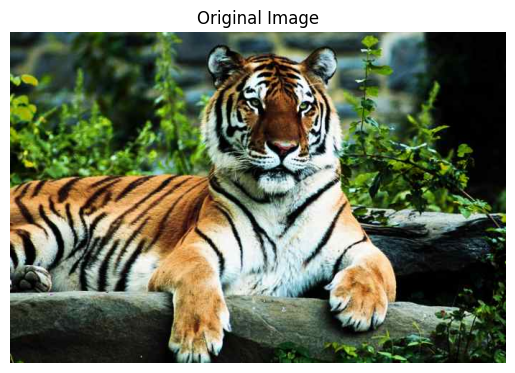

Optimal thresholds for N=3: (66, 152)
Minimum within-group variance: 568.2176206291498


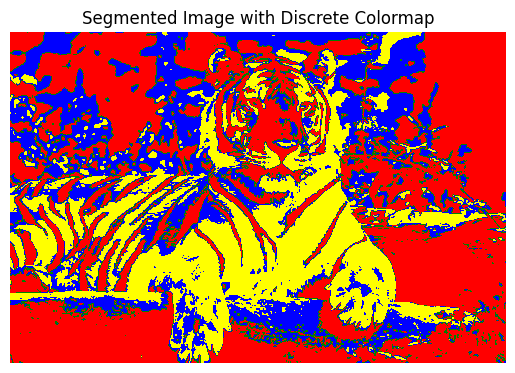

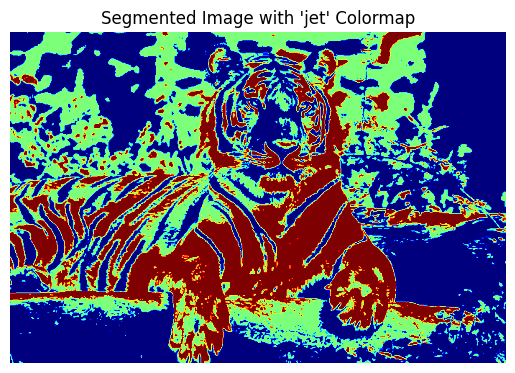

Unique intensities and counts in segmented image: {64: 144054, 128: 98359, 192: 75677}


In [3]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR)
image_bgr = cv2.imread("/kaggle/input/otsudataset/tiger1.bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples,
# as expected by the segmentation functions.
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R,G,B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B)
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j)
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    
    # Compute variance using a direct loop (for demonstration).
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalized histogram (length 256) and a target number of regions N,
    return the thresholds that minimize the total within-class variance.
    
    For N=2, returns a single threshold.
    For N=3, returns two thresholds.
    For N=4, returns three thresholds.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
    
    return best_thresholds, min_variance

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalize the histogram.
      3. Apply multi-threshold Otsu segmentation.
      4. Return the segmented image.
    """
    grey_image = convert_to_greyscale(rgb_image)
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)
    thresholds, final_var = otsu_multi_threshold(norm_hist, N)
    print(f"Optimal thresholds for N={N}:", thresholds)
    print(f"Minimum within-group variance: {final_var}")
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)
    return segmented_image

# ------------------------------
# PART 3: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 3

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert segmented (a 2D list) to a NumPy array for display/analysis
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Using a discrete colormap to clearly show each region.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])

plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Using a continuous colormap like 'jet' for extra contrast.
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Option 3: Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))


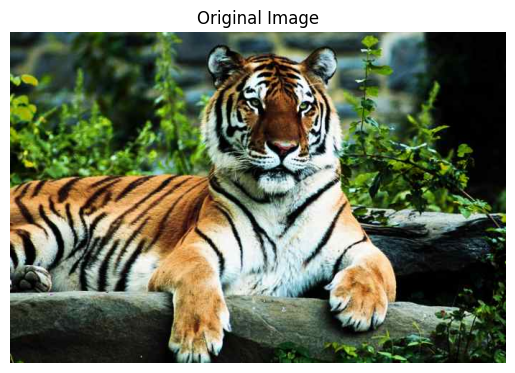

Optimal thresholds for N=4: (48, 109, 177)
Minimum within-group variance: 321.1087978231897


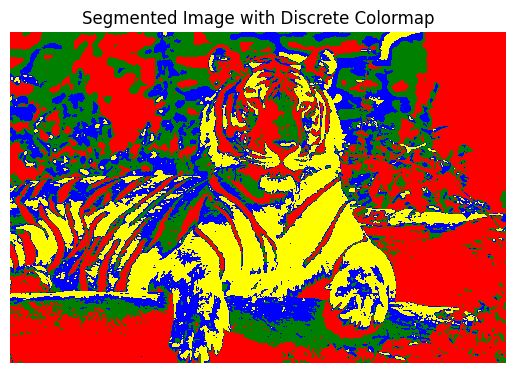

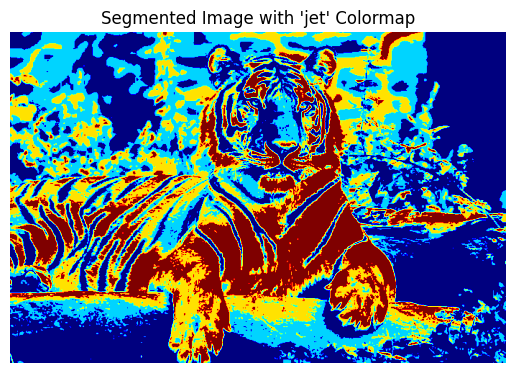

Unique intensities and counts in segmented image: {64: 115312, 128: 84696, 192: 64194, 255: 53888}


In [4]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR)
image_bgr = cv2.imread("/kaggle/input/otsudataset/tiger1.bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples,
# as expected by the segmentation functions.
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R,G,B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B)
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j)
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    
    # Compute variance using a direct loop (for demonstration).
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalized histogram (length 256) and a target number of regions N,
    return the thresholds that minimize the total within-class variance.
    
    For N=2, returns a single threshold.
    For N=3, returns two thresholds.
    For N=4, returns three thresholds.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
    
    return best_thresholds, min_variance

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalize the histogram.
      3. Apply multi-threshold Otsu segmentation.
      4. Return the segmented image.
    """
    grey_image = convert_to_greyscale(rgb_image)
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)
    thresholds, final_var = otsu_multi_threshold(norm_hist, N)
    print(f"Optimal thresholds for N={N}:", thresholds)
    print(f"Minimum within-group variance: {final_var}")
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)
    return segmented_image

# ------------------------------
# PART 3: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 4

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert segmented (a 2D list) to a NumPy array for display/analysis
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Using a discrete colormap to clearly show each region.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])

plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Using a continuous colormap like 'jet' for extra contrast.
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Option 3: Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))


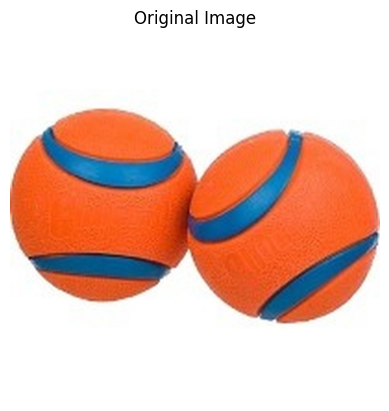

Optimal thresholds for N=4: (99, 133, 199)
Minimum within-group variance: 55.608803944216966


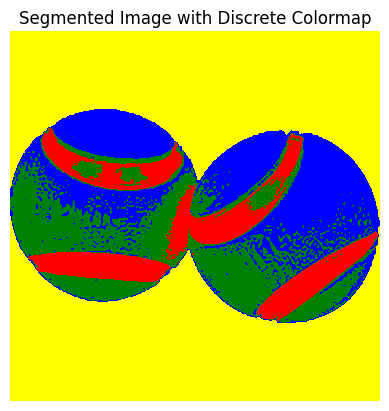

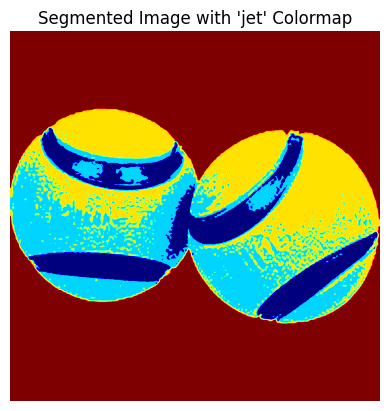

Unique intensities and counts in segmented image: {64: 126775, 128: 232355, 192: 245520, 255: 835350}


In [5]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR)
image_bgr = cv2.imread("/kaggle/input/otsudataset/basket_balls.bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples,
# as expected by the segmentation functions.
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R,G,B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B)
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j)
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    
    # Compute variance using a direct loop (for demonstration).
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalized histogram (length 256) and a target number of regions N,
    return the thresholds that minimize the total within-class variance.
    
    For N=2, returns a single threshold.
    For N=3, returns two thresholds.
    For N=4, returns three thresholds.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
    
    return best_thresholds, min_variance

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalize the histogram.
      3. Apply multi-threshold Otsu segmentation.
      4. Return the segmented image.
    """
    grey_image = convert_to_greyscale(rgb_image)
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)
    thresholds, final_var = otsu_multi_threshold(norm_hist, N)
    print(f"Optimal thresholds for N={N}:", thresholds)
    print(f"Minimum within-group variance: {final_var}")
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)
    return segmented_image

# ------------------------------
# PART 3: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 4

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert segmented (a 2D list) to a NumPy array for display/analysis
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Using a discrete colormap to clearly show each region.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])

plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Using a continuous colormap like 'jet' for extra contrast.
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Option 3: Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))


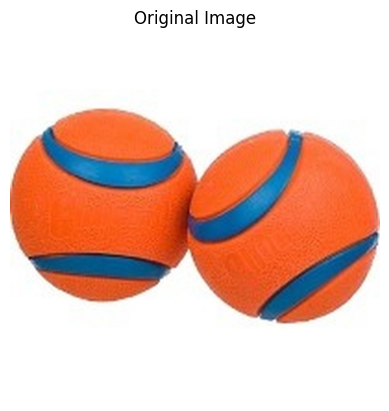

Optimal thresholds for N=2: (187,)
Minimum within-group variance: 327.73814052981896


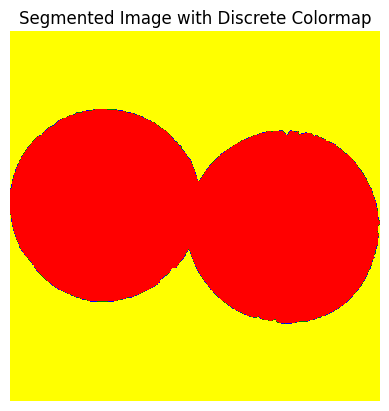

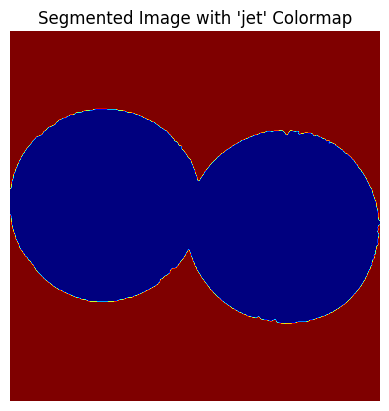

Unique intensities and counts in segmented image: {64: 601860, 128: 838140}


In [7]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR)
image_bgr = cv2.imread("/kaggle/input/otsudataset/basket_balls.bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples,
# as expected by the segmentation functions.
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R,G,B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B)
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j)
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    
    # Compute variance using a direct loop (for demonstration).
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalized histogram (length 256) and a target number of regions N,
    return the thresholds that minimize the total within-class variance.
    
    For N=2, returns a single threshold.
    For N=3, returns two thresholds.
    For N=4, returns three thresholds.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
    
    return best_thresholds, min_variance

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalize the histogram.
      3. Apply multi-threshold Otsu segmentation.
      4. Return the segmented image.
    """
    grey_image = convert_to_greyscale(rgb_image)
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)
    thresholds, final_var = otsu_multi_threshold(norm_hist, N)
    print(f"Optimal thresholds for N={N}:", thresholds)
    print(f"Minimum within-group variance: {final_var}")
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)
    return segmented_image

# ------------------------------
# PART 3: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 2

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert segmented (a 2D list) to a NumPy array for display/analysis
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Using a discrete colormap to clearly show each region.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])

plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Using a continuous colormap like 'jet' for extra contrast.
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Option 3: Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))


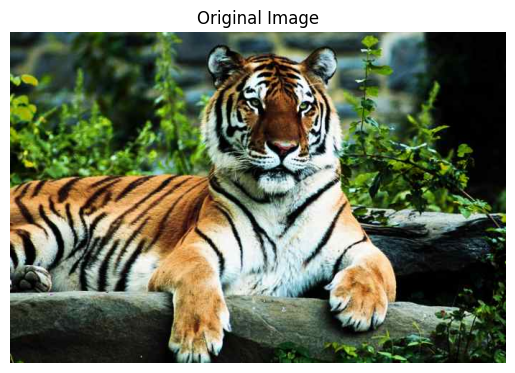

Optimal thresholds for N=2: (108,)
Minimum within-group variance: 1295.6351638032734


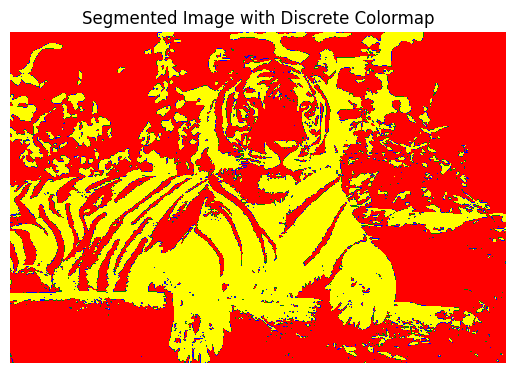

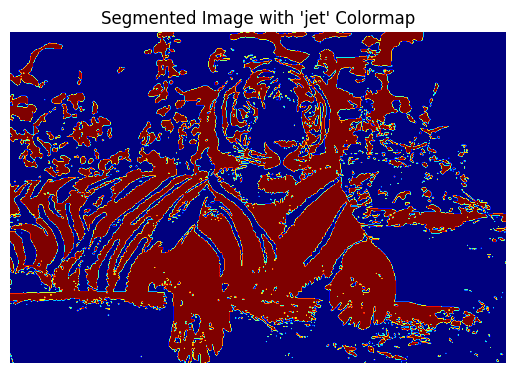

Unique intensities and counts in segmented image: {64: 198926, 128: 119164}


In [9]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR)
image_bgr = cv2.imread("/kaggle/input/otsudataset/tiger1.bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples,
# as expected by the segmentation functions.
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R,G,B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B)
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j)
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    
    # Compute variance using a direct loop (for demonstration).
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalized histogram (length 256) and a target number of regions N,
    return the thresholds that minimize the total within-class variance.
    
    For N=2, returns a single threshold.
    For N=3, returns two thresholds.
    For N=4, returns three thresholds.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
    
    return best_thresholds, min_variance

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalize the histogram.
      3. Apply multi-threshold Otsu segmentation.
      4. Return the segmented image.
    """
    grey_image = convert_to_greyscale(rgb_image)
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)
    thresholds, final_var = otsu_multi_threshold(norm_hist, N)
    print(f"Optimal thresholds for N={N}:", thresholds)
    print(f"Minimum within-group variance: {final_var}")
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)
    return segmented_image

# ------------------------------
# PART 3: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 2

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert segmented (a 2D list) to a NumPy array for display/analysis
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Using a discrete colormap to clearly show each region.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])

plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Using a continuous colormap like 'jet' for extra contrast.
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Option 3: Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))


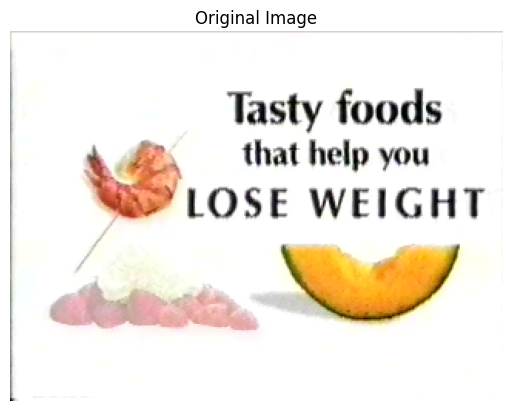

Optimal thresholds for N=3: (119, 216)
Minimum within-group variance: 157.3908449719775


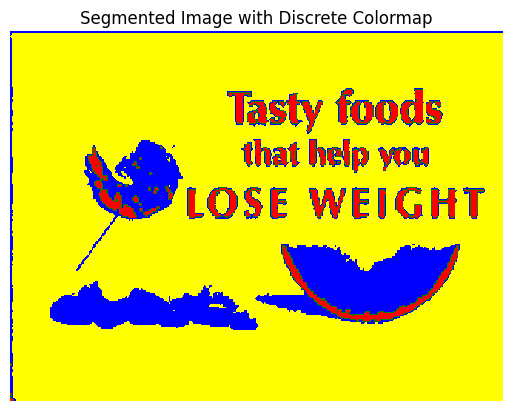

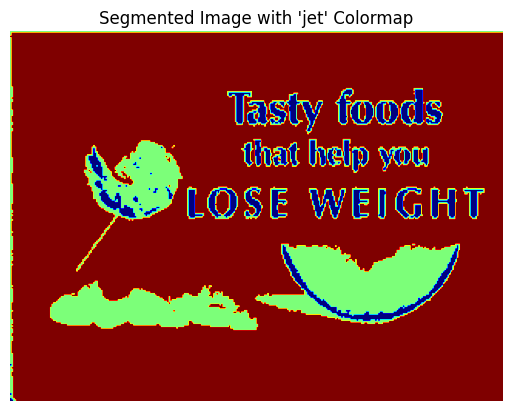

Unique intensities and counts in segmented image: {64: 3493, 128: 10634, 192: 62673}


In [12]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR)
image_bgr = cv2.imread("/kaggle/input/otsudataset/data13 (1).bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples,
# as expected by the segmentation functions.
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R,G,B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B)
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j)
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    
    # Compute variance using a direct loop (for demonstration).
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalized histogram (length 256) and a target number of regions N,
    return the thresholds that minimize the total within-class variance.
    
    For N=2, returns a single threshold.
    For N=3, returns two thresholds.
    For N=4, returns three thresholds.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
    
    return best_thresholds, min_variance

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalize the histogram.
      3. Apply multi-threshold Otsu segmentation.
      4. Return the segmented image.
    """
    grey_image = convert_to_greyscale(rgb_image)
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)
    thresholds, final_var = otsu_multi_threshold(norm_hist, N)
    print(f"Optimal thresholds for N={N}:", thresholds)
    print(f"Minimum within-group variance: {final_var}")
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)
    return segmented_image

# ------------------------------
# PART 3: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 3

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert segmented (a 2D list) to a NumPy array for display/analysis
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Using a discrete colormap to clearly show each region.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])

plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Using a continuous colormap like 'jet' for extra contrast.
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Option 3: Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))


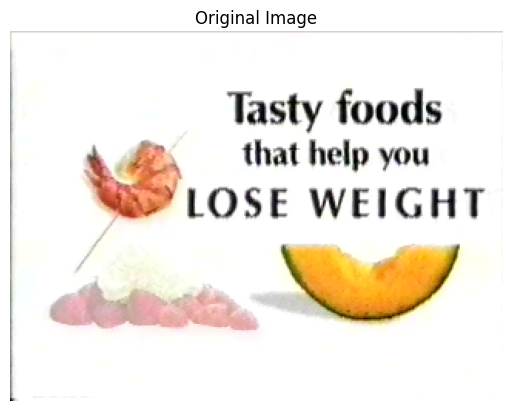

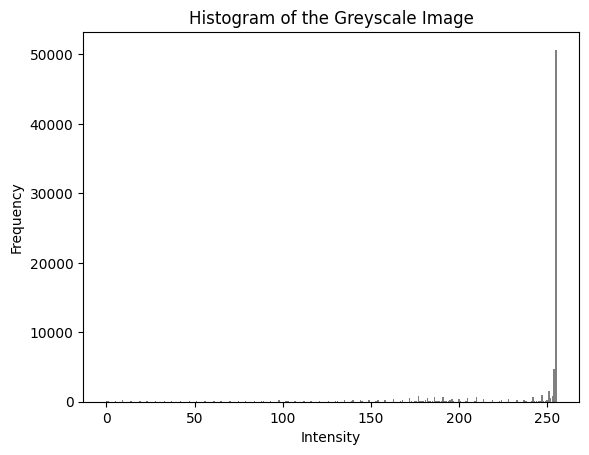

Optimal thresholds for N=4: (76, 154, 221)
Within-group variances: (533.7761499167899, 544.6562993043917, 256.41354796086443, 18.047303563053326)
Final total variance: 82.61031549127041


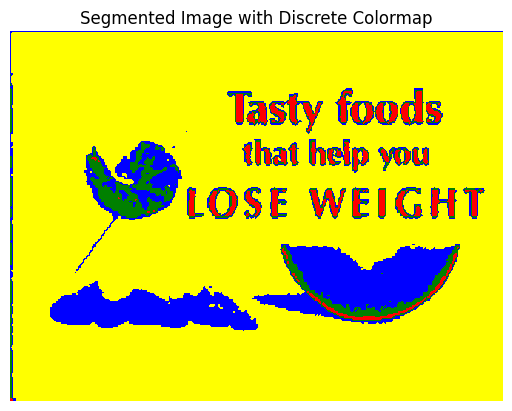

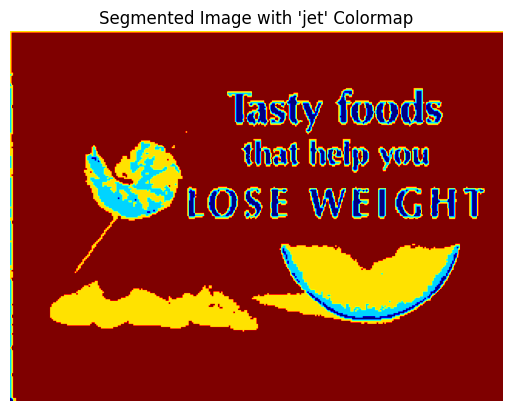

Unique intensities and counts in segmented image: {64: 2080, 128: 3233, 192: 9159, 255: 62328}


True

In [15]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR)
image_bgr = cv2.imread("/kaggle/input/otsudataset/data13 (1).bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R,G,B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B)
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j)
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalized histogram (length 256) and a target number of regions N,
    return the thresholds that minimise the total within-class variance,
    along with the within-group variances.
    
    For N=2, returns a single threshold and variances for two regions.
    For N=3, returns two thresholds and variances for three regions.
    For N=4, returns three thresholds and variances for four regions.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    best_within_vars = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
                best_within_vars = (v1, v2)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
                    best_within_vars = (v1, v2, v3)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
                        best_within_vars = (v1, v2, v3, v4)
    
    return best_thresholds, min_variance, best_within_vars

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalise the histogram.
      3. Display and save the histogram.
      4. Apply multi-threshold Otsu segmentation.
      5. Print optimal thresholds, within-group variances and final total variance.
      6. Return the segmented image.
    """
    grey_image = convert_to_greyscale(rgb_image)
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)
    
    # Display and save the histogram
    # plt.figure()
    # plt.bar(range(256), hist, color='gray')
    # plt.title("Histogram of the Greyscale Image")
    # plt.xlabel("Intensity")
    # plt.ylabel("Frequency")
    # plt.savefig("data13-histogram.bmp")
    # plt.show()



    # Display and save the histogram
    plt.figure()
    plt.bar(range(256), hist, color='gray')
    plt.title("Histogram of the Greyscale Image")
    plt.xlabel("Intensity")
    plt.ylabel("Frequency")
    # Save as a temporary PNG file
    plt.savefig("temp_histogram.png")
    plt.show()
    
    # Convert the saved PNG to BMP using OpenCV
    temp_hist = cv2.imread("temp_histogram.png")
    cv2.imwrite("data13-histogram.bmp", temp_hist)



    
    
    thresholds, final_var, within_group_vars = otsu_multi_threshold(norm_hist, N)
    print(f"Optimal thresholds for N={N}:", thresholds)
    print("Within-group variances:", within_group_vars)
    print("Final total variance:", final_var)

    
    
    
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)
    return segmented_image

# ------------------------------
# PART 3: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 4

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert segmented (a 2D list) to a NumPy array for display/analysis
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Display using a discrete colormap.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])
plt.figure()
plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Display using a continuous colormap like 'jet'.
plt.figure()
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))

# Save the segmented image in BMP format with the required naming convention.
cv2.imwrite("data13-out.bmp", segmented_np)


Show from here

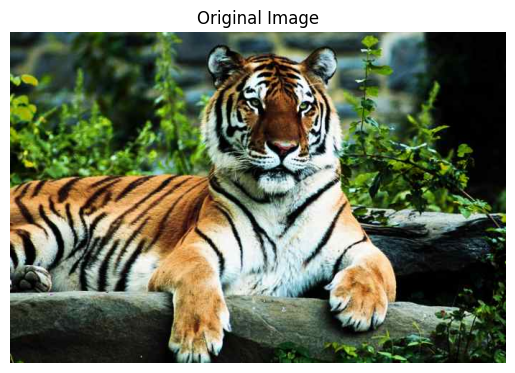

Optimal thresholds for N=4: (48, 109, 177)
Minimum within-group variance: 321.1087978231897


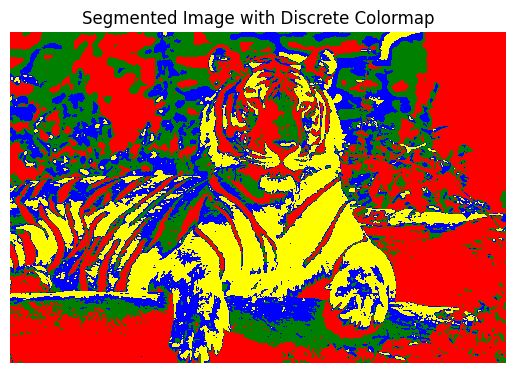

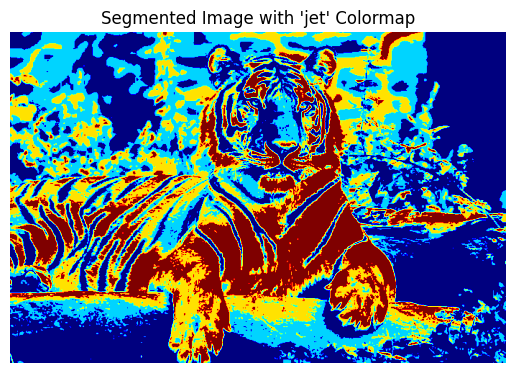

Unique intensities and counts in segmented image: {64: 115312, 128: 84696, 192: 64194, 255: 53888}


In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR)
image_bgr = cv2.imread("/kaggle/input/otsudataset/tiger1.bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples,
# as expected by the segmentation functions.
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R,G,B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B)
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j)
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    
    # Compute variance using a direct loop (for demonstration).
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalized histogram (length 256) and a target number of regions N,
    return the thresholds that minimize the total within-class variance.
    
    For N=2, returns a single threshold.
    For N=3, returns two thresholds.
    For N=4, returns three thresholds.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
    
    return best_thresholds, min_variance

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalize the histogram.
      3. Apply multi-threshold Otsu segmentation.
      4. Return the segmented image.
    """
    grey_image = convert_to_greyscale(rgb_image)
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)
    thresholds, final_var = otsu_multi_threshold(norm_hist, N)
    print(f"Optimal thresholds for N={N}:", thresholds)
    print(f"Minimum within-group variance: {final_var}")
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)
    return segmented_image

# ------------------------------
# PART 3: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 4

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert segmented (a 2D list) to a NumPy array for display/analysis
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Using a discrete colormap to clearly show each region.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])

plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Using a continuous colormap like 'jet' for extra contrast.
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Option 3: Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))


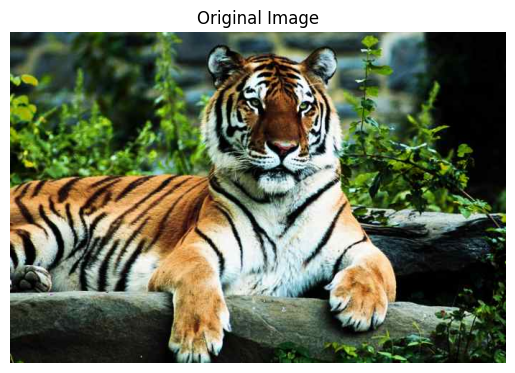

Optimal thresholds for N=3: (66, 152)
Minimum within-group variance: 568.2176206291498


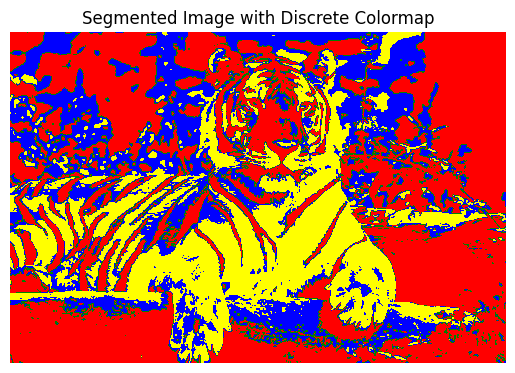

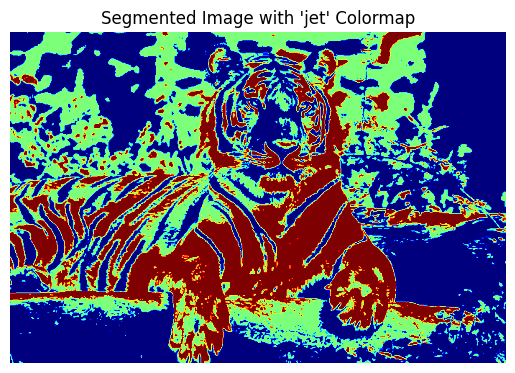

Unique intensities and counts in segmented image: {64: 144054, 128: 98359, 192: 75677}


In [2]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR)
image_bgr = cv2.imread("/kaggle/input/otsudataset/tiger1.bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples,
# as expected by the segmentation functions.
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R,G,B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B)
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j)
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    
    # Compute variance using a direct loop (for demonstration).
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalized histogram (length 256) and a target number of regions N,
    return the thresholds that minimize the total within-class variance.
    
    For N=2, returns a single threshold.
    For N=3, returns two thresholds.
    For N=4, returns three thresholds.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
    
    return best_thresholds, min_variance

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalize the histogram.
      3. Apply multi-threshold Otsu segmentation.
      4. Return the segmented image.
    """
    grey_image = convert_to_greyscale(rgb_image)
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)
    thresholds, final_var = otsu_multi_threshold(norm_hist, N)
    print(f"Optimal thresholds for N={N}:", thresholds)
    print(f"Minimum within-group variance: {final_var}")
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)
    return segmented_image

# ------------------------------
# PART 3: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 3

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert segmented (a 2D list) to a NumPy array for display/analysis
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Using a discrete colormap to clearly show each region.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])

plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Using a continuous colormap like 'jet' for extra contrast.
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Option 3: Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))


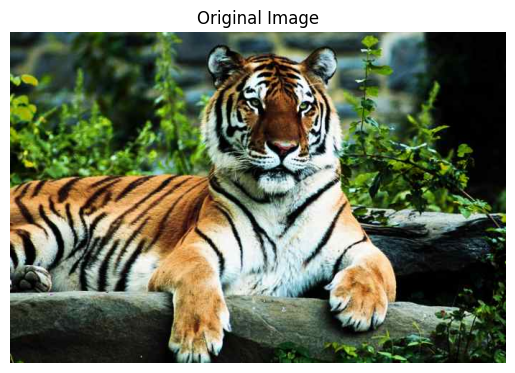

Optimal thresholds for N=2: (108,)
Minimum within-group variance: 1295.6351638032734


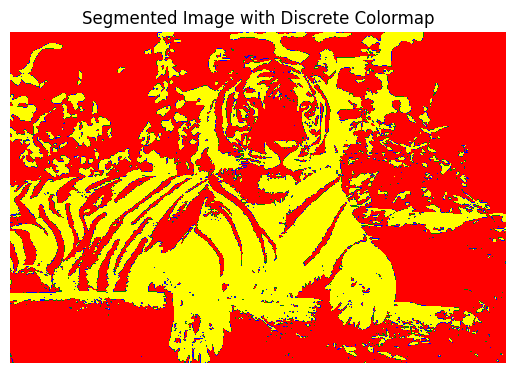

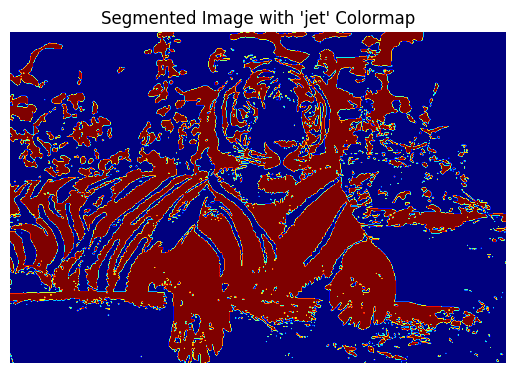

Unique intensities and counts in segmented image: {64: 198926, 128: 119164}


In [3]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR)
image_bgr = cv2.imread("/kaggle/input/otsudataset/tiger1.bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples,
# as expected by the segmentation functions.
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R,G,B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B)
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j)
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    
    # Compute variance using a direct loop (for demonstration).
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalized histogram (length 256) and a target number of regions N,
    return the thresholds that minimize the total within-class variance.
    
    For N=2, returns a single threshold.
    For N=3, returns two thresholds.
    For N=4, returns three thresholds.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
    
    return best_thresholds, min_variance

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalize the histogram.
      3. Apply multi-threshold Otsu segmentation.
      4. Return the segmented image.
    """
    grey_image = convert_to_greyscale(rgb_image)
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)
    thresholds, final_var = otsu_multi_threshold(norm_hist, N)
    print(f"Optimal thresholds for N={N}:", thresholds)
    print(f"Minimum within-group variance: {final_var}")
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)
    return segmented_image

# ------------------------------
# PART 3: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 2

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert segmented (a 2D list) to a NumPy array for display/analysis
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Using a discrete colormap to clearly show each region.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])

plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Using a continuous colormap like 'jet' for extra contrast.
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Option 3: Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))


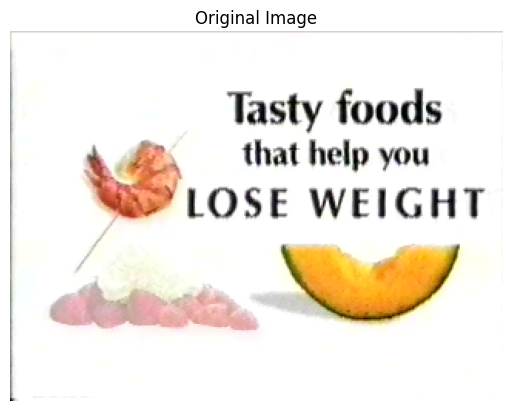

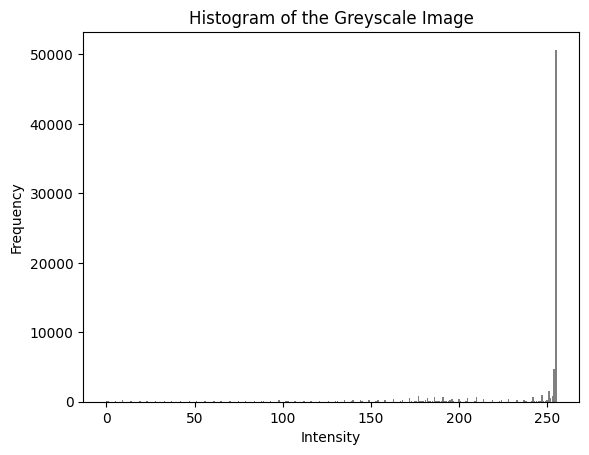

Optimal thresholds for N=4: (76, 154, 221)
Within-group variances: (533.7761499167899, 544.6562993043917, 256.41354796086443, 18.047303563053326)
Final total variance: 82.61031549127041


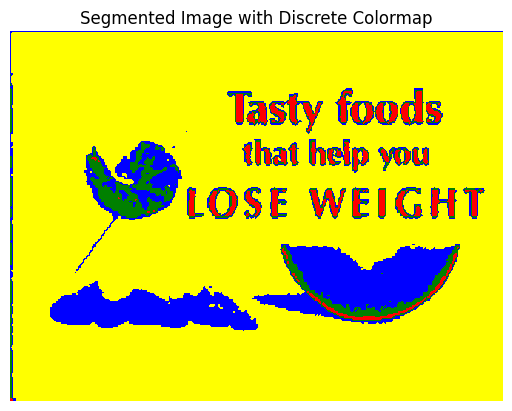

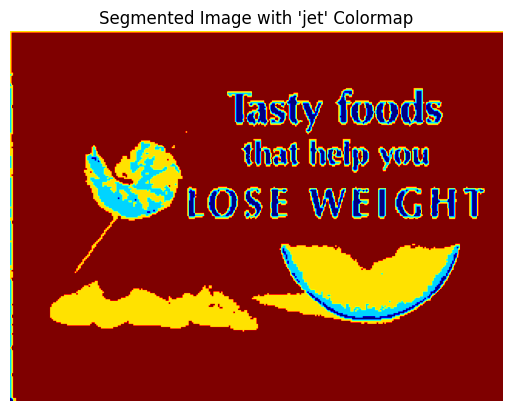

Unique intensities and counts in segmented image: {64: 2080, 128: 3233, 192: 9159, 255: 62328}


True

In [4]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR)
image_bgr = cv2.imread("/kaggle/input/otsudataset/data13 (1).bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R,G,B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B)
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j)
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalized histogram (length 256) and a target number of regions N,
    return the thresholds that minimise the total within-class variance,
    along with the within-group variances.
    
    For N=2, returns a single threshold and variances for two regions.
    For N=3, returns two thresholds and variances for three regions.
    For N=4, returns three thresholds and variances for four regions.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    best_within_vars = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
                best_within_vars = (v1, v2)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
                    best_within_vars = (v1, v2, v3)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
                        best_within_vars = (v1, v2, v3, v4)
    
    return best_thresholds, min_variance, best_within_vars

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalise the histogram.
      3. Display and save the histogram.
      4. Apply multi-threshold Otsu segmentation.
      5. Print optimal thresholds, within-group variances and final total variance.
      6. Return the segmented image.
    """
    grey_image = convert_to_greyscale(rgb_image)
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)
    
    # Display and save the histogram
    # plt.figure()
    # plt.bar(range(256), hist, color='gray')
    # plt.title("Histogram of the Greyscale Image")
    # plt.xlabel("Intensity")
    # plt.ylabel("Frequency")
    # plt.savefig("data13-histogram.bmp")
    # plt.show()



    # Display and save the histogram
    plt.figure()
    plt.bar(range(256), hist, color='gray')
    plt.title("Histogram of the Greyscale Image")
    plt.xlabel("Intensity")
    plt.ylabel("Frequency")
    # Save as a temporary PNG file
    plt.savefig("temp_histogram.png")
    plt.show()
    
    # Convert the saved PNG to BMP using OpenCV
    temp_hist = cv2.imread("temp_histogram.png")
    cv2.imwrite("data13-histogram.bmp", temp_hist)



    
    
    thresholds, final_var, within_group_vars = otsu_multi_threshold(norm_hist, N)
    print(f"Optimal thresholds for N={N}:", thresholds)
    print("Within-group variances:", within_group_vars)
    print("Final total variance:", final_var)

    
    
    
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)
    return segmented_image

# ------------------------------
# PART 3: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 4

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert segmented (a 2D list) to a NumPy array for display/analysis
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Display using a discrete colormap.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])
plt.figure()
plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Display using a continuous colormap like 'jet'.
plt.figure()
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))

# Save the segmented image in BMP format with the required naming convention.
cv2.imwrite("data13-out.bmp", segmented_np)


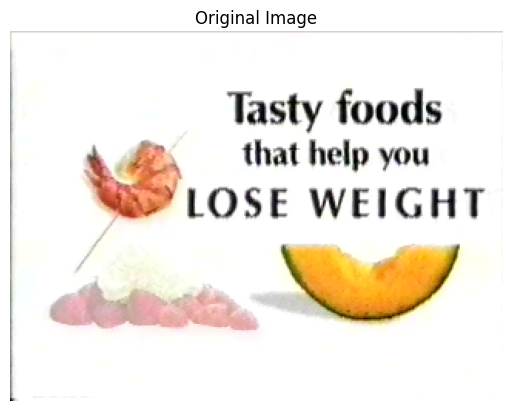

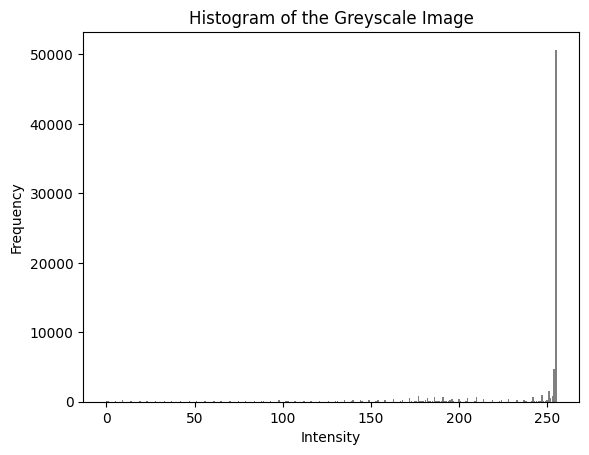

Optimal thresholds for N=3: (119, 216)
Within-group variances: (1369.6422709227709, 541.9420377553428, 24.5790820931552)
Final total variance: 157.3908449719775


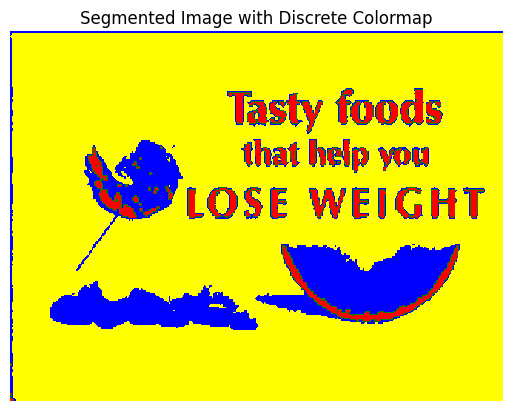

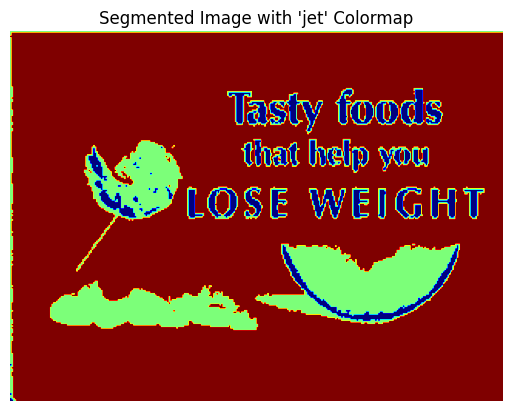

Unique intensities and counts in segmented image: {64: 3493, 128: 10634, 192: 62673}


True

In [5]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR)
image_bgr = cv2.imread("/kaggle/input/otsudataset/data13 (1).bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R,G,B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B)
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j)
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalized histogram (length 256) and a target number of regions N,
    return the thresholds that minimise the total within-class variance,
    along with the within-group variances.
    
    For N=2, returns a single threshold and variances for two regions.
    For N=3, returns two thresholds and variances for three regions.
    For N=4, returns three thresholds and variances for four regions.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    best_within_vars = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
                best_within_vars = (v1, v2)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
                    best_within_vars = (v1, v2, v3)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
                        best_within_vars = (v1, v2, v3, v4)
    
    return best_thresholds, min_variance, best_within_vars

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalise the histogram.
      3. Display and save the histogram.
      4. Apply multi-threshold Otsu segmentation.
      5. Print optimal thresholds, within-group variances and final total variance.
      6. Return the segmented image.
    """
    grey_image = convert_to_greyscale(rgb_image)
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)
    
    # Display and save the histogram
    # plt.figure()
    # plt.bar(range(256), hist, color='gray')
    # plt.title("Histogram of the Greyscale Image")
    # plt.xlabel("Intensity")
    # plt.ylabel("Frequency")
    # plt.savefig("data13-histogram.bmp")
    # plt.show()



    # Display and save the histogram
    plt.figure()
    plt.bar(range(256), hist, color='gray')
    plt.title("Histogram of the Greyscale Image")
    plt.xlabel("Intensity")
    plt.ylabel("Frequency")
    # Save as a temporary PNG file
    plt.savefig("temp_histogram.png")
    plt.show()
    
    # Convert the saved PNG to BMP using OpenCV
    temp_hist = cv2.imread("temp_histogram.png")
    cv2.imwrite("data13-histogram.bmp", temp_hist)



    
    
    thresholds, final_var, within_group_vars = otsu_multi_threshold(norm_hist, N)
    print(f"Optimal thresholds for N={N}:", thresholds)
    print("Within-group variances:", within_group_vars)
    print("Final total variance:", final_var)

    
    
    
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)
    return segmented_image

# ------------------------------
# PART 3: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 3

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert segmented (a 2D list) to a NumPy array for display/analysis
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Display using a discrete colormap.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])
plt.figure()
plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Display using a continuous colormap like 'jet'.
plt.figure()
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))

# Save the segmented image in BMP format with the required naming convention.
cv2.imwrite("data13-out.bmp", segmented_np)


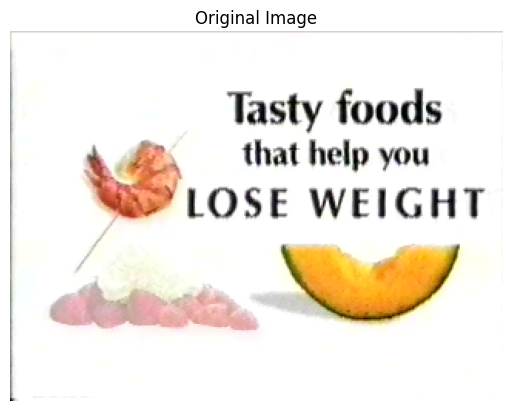

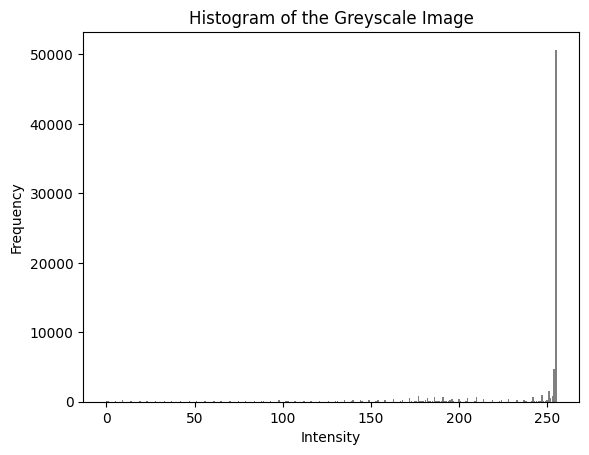

Optimal thresholds for N=2: (192,)
Within-group variances: (3285.22362054694, 138.1840710607791)
Final total variance: 583.9327197497174


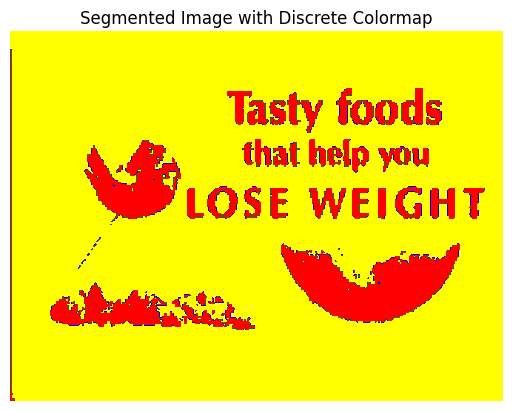

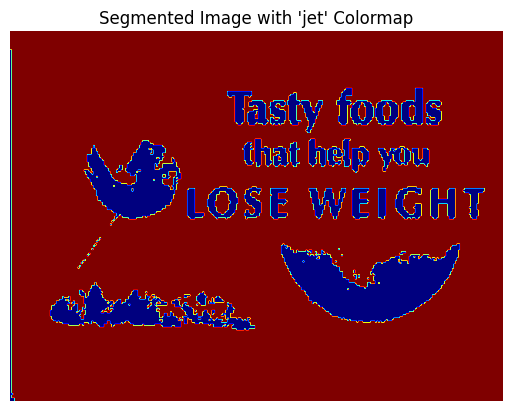

Unique intensities and counts in segmented image: {64: 10878, 128: 65922}


True

In [6]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR)
image_bgr = cv2.imread("/kaggle/input/otsudataset/data13 (1).bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R,G,B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B)
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j)
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalized histogram (length 256) and a target number of regions N,
    return the thresholds that minimise the total within-class variance,
    along with the within-group variances.
    
    For N=2, returns a single threshold and variances for two regions.
    For N=3, returns two thresholds and variances for three regions.
    For N=4, returns three thresholds and variances for four regions.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    best_within_vars = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
                best_within_vars = (v1, v2)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
                    best_within_vars = (v1, v2, v3)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
                        best_within_vars = (v1, v2, v3, v4)
    
    return best_thresholds, min_variance, best_within_vars

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalise the histogram.
      3. Display and save the histogram.
      4. Apply multi-threshold Otsu segmentation.
      5. Print optimal thresholds, within-group variances and final total variance.
      6. Return the segmented image.
    """
    grey_image = convert_to_greyscale(rgb_image)
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)
    
    # Display and save the histogram
    # plt.figure()
    # plt.bar(range(256), hist, color='gray')
    # plt.title("Histogram of the Greyscale Image")
    # plt.xlabel("Intensity")
    # plt.ylabel("Frequency")
    # plt.savefig("data13-histogram.bmp")
    # plt.show()



    # Display and save the histogram
    plt.figure()
    plt.bar(range(256), hist, color='gray')
    plt.title("Histogram of the Greyscale Image")
    plt.xlabel("Intensity")
    plt.ylabel("Frequency")
    # Save as a temporary PNG file
    plt.savefig("temp_histogram.png")
    plt.show()
    
    # Convert the saved PNG to BMP using OpenCV
    temp_hist = cv2.imread("temp_histogram.png")
    cv2.imwrite("data13-histogram.bmp", temp_hist)



    
    
    thresholds, final_var, within_group_vars = otsu_multi_threshold(norm_hist, N)
    print(f"Optimal thresholds for N={N}:", thresholds)
    print("Within-group variances:", within_group_vars)
    print("Final total variance:", final_var)

    
    
    
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)
    return segmented_image

# ------------------------------
# PART 3: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 2

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert segmented (a 2D list) to a NumPy array for display/analysis
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Display using a discrete colormap.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])
plt.figure()
plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Display using a continuous colormap like 'jet'.
plt.figure()
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))

# Save the segmented image in BMP format with the required naming convention.
cv2.imwrite("data13-out.bmp", segmented_np)


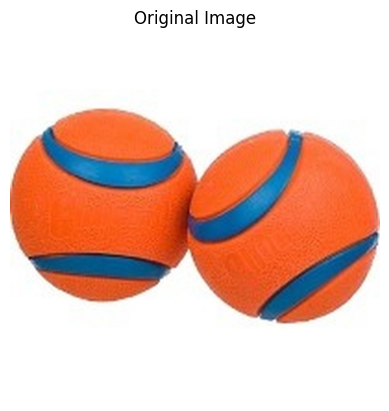

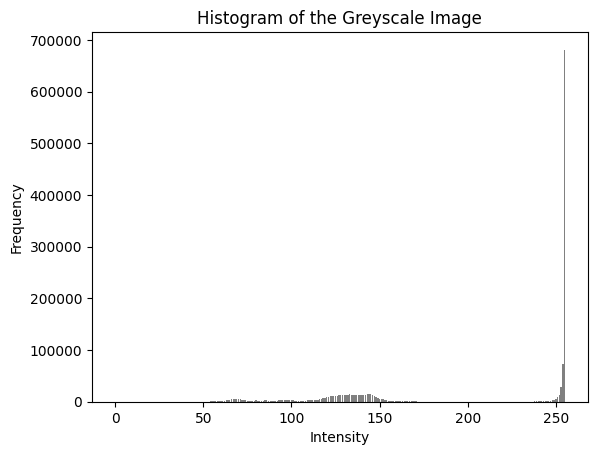

Optimal thresholds for N=4: (99, 133, 199)
Within-group variances: (192.41437130862053, 69.35895232344896, 100.39076712742173, 17.860184646893533)
Final total variance: 55.608803944216966


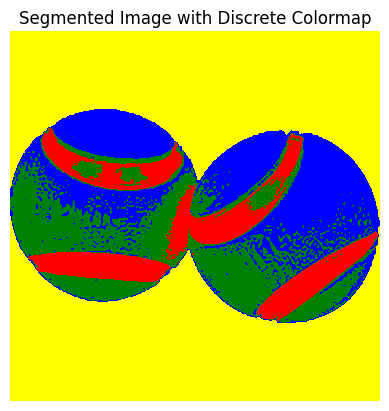

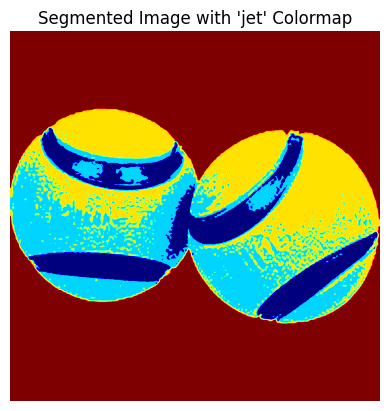

Unique intensities and counts in segmented image: {64: 126775, 128: 232355, 192: 245520, 255: 835350}


True

In [7]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR)
image_bgr = cv2.imread("/kaggle/input/otsudataset/basket_balls.bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R,G,B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B)
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j)
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalized histogram (length 256) and a target number of regions N,
    return the thresholds that minimise the total within-class variance,
    along with the within-group variances.
    
    For N=2, returns a single threshold and variances for two regions.
    For N=3, returns two thresholds and variances for three regions.
    For N=4, returns three thresholds and variances for four regions.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    best_within_vars = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
                best_within_vars = (v1, v2)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
                    best_within_vars = (v1, v2, v3)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
                        best_within_vars = (v1, v2, v3, v4)
    
    return best_thresholds, min_variance, best_within_vars

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalise the histogram.
      3. Display and save the histogram.
      4. Apply multi-threshold Otsu segmentation.
      5. Print optimal thresholds, within-group variances and final total variance.
      6. Return the segmented image.
    """
    grey_image = convert_to_greyscale(rgb_image)
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)
    
    # Display and save the histogram
    # plt.figure()
    # plt.bar(range(256), hist, color='gray')
    # plt.title("Histogram of the Greyscale Image")
    # plt.xlabel("Intensity")
    # plt.ylabel("Frequency")
    # plt.savefig("data13-histogram.bmp")
    # plt.show()



    # Display and save the histogram
    plt.figure()
    plt.bar(range(256), hist, color='gray')
    plt.title("Histogram of the Greyscale Image")
    plt.xlabel("Intensity")
    plt.ylabel("Frequency")
    # Save as a temporary PNG file
    plt.savefig("temp_histogram.png")
    plt.show()
    
    # Convert the saved PNG to BMP using OpenCV
    temp_hist = cv2.imread("temp_histogram.png")
    cv2.imwrite("data13-histogram.bmp", temp_hist)



    
    
    thresholds, final_var, within_group_vars = otsu_multi_threshold(norm_hist, N)
    print(f"Optimal thresholds for N={N}:", thresholds)
    print("Within-group variances:", within_group_vars)
    print("Final total variance:", final_var)

    
    
    
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)
    return segmented_image

# ------------------------------
# PART 3: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 4

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert segmented (a 2D list) to a NumPy array for display/analysis
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Display using a discrete colormap.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])
plt.figure()
plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Display using a continuous colormap like 'jet'.
plt.figure()
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))

# Save the segmented image in BMP format with the required naming convention.
cv2.imwrite("data13-out.bmp", segmented_np)


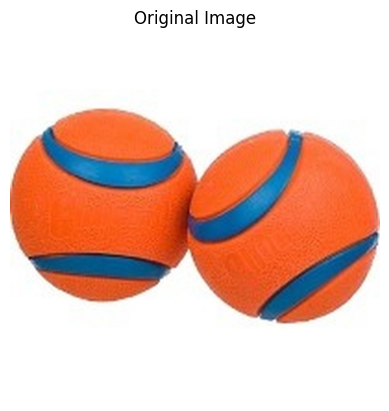

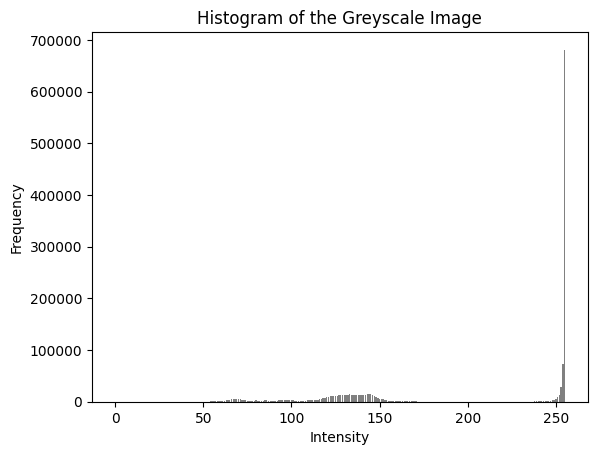

Optimal thresholds for N=3: (106, 194)
Within-group variances: (242.48684987526445, 169.8935607692426, 22.41276008756509)
Final total variance: 91.3995805037327


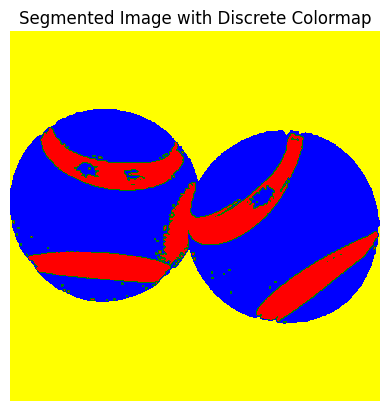

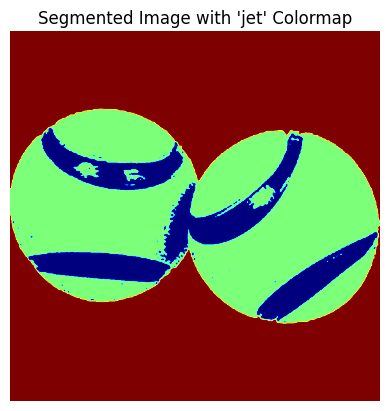

Unique intensities and counts in segmented image: {64: 142436, 128: 461040, 192: 836524}


True

In [8]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR)
image_bgr = cv2.imread("/kaggle/input/otsudataset/basket_balls.bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R,G,B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B)
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j)
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalized histogram (length 256) and a target number of regions N,
    return the thresholds that minimise the total within-class variance,
    along with the within-group variances.
    
    For N=2, returns a single threshold and variances for two regions.
    For N=3, returns two thresholds and variances for three regions.
    For N=4, returns three thresholds and variances for four regions.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    best_within_vars = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
                best_within_vars = (v1, v2)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
                    best_within_vars = (v1, v2, v3)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
                        best_within_vars = (v1, v2, v3, v4)
    
    return best_thresholds, min_variance, best_within_vars

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalise the histogram.
      3. Display and save the histogram.
      4. Apply multi-threshold Otsu segmentation.
      5. Print optimal thresholds, within-group variances and final total variance.
      6. Return the segmented image.
    """
    grey_image = convert_to_greyscale(rgb_image)
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)
    
    # Display and save the histogram
    # plt.figure()
    # plt.bar(range(256), hist, color='gray')
    # plt.title("Histogram of the Greyscale Image")
    # plt.xlabel("Intensity")
    # plt.ylabel("Frequency")
    # plt.savefig("data13-histogram.bmp")
    # plt.show()



    # Display and save the histogram
    plt.figure()
    plt.bar(range(256), hist, color='gray')
    plt.title("Histogram of the Greyscale Image")
    plt.xlabel("Intensity")
    plt.ylabel("Frequency")
    # Save as a temporary PNG file
    plt.savefig("temp_histogram.png")
    plt.show()
    
    # Convert the saved PNG to BMP using OpenCV
    temp_hist = cv2.imread("temp_histogram.png")
    cv2.imwrite("data13-histogram.bmp", temp_hist)



    
    
    thresholds, final_var, within_group_vars = otsu_multi_threshold(norm_hist, N)
    print(f"Optimal thresholds for N={N}:", thresholds)
    print("Within-group variances:", within_group_vars)
    print("Final total variance:", final_var)

    
    
    
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)
    return segmented_image

# ------------------------------
# PART 3: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 3

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert segmented (a 2D list) to a NumPy array for display/analysis
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Display using a discrete colormap.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])
plt.figure()
plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Display using a continuous colormap like 'jet'.
plt.figure()
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))

# Save the segmented image in BMP format with the required naming convention.
cv2.imwrite("data13-out.bmp", segmented_np)


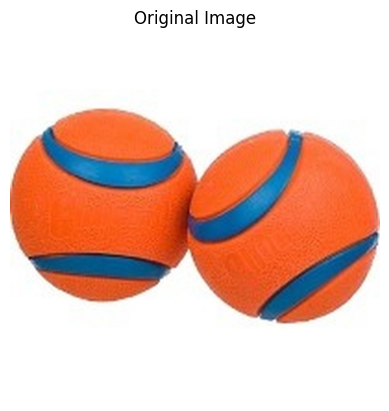

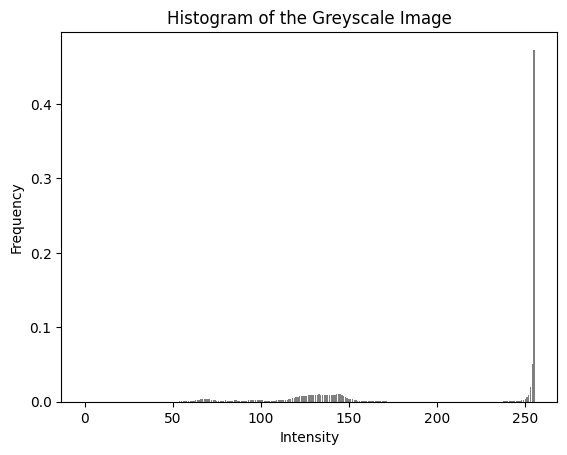

Optimal thresholds for N=2: (187,)
Within-group variances: (742.2857629900019, 30.055614873143995)
Final total variance: 327.73814052981896


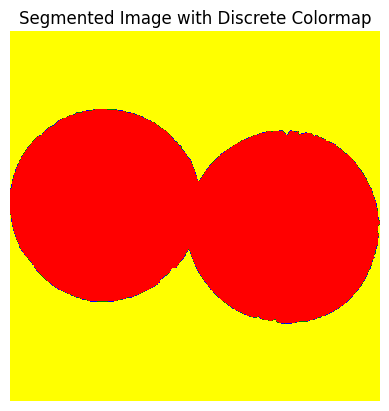

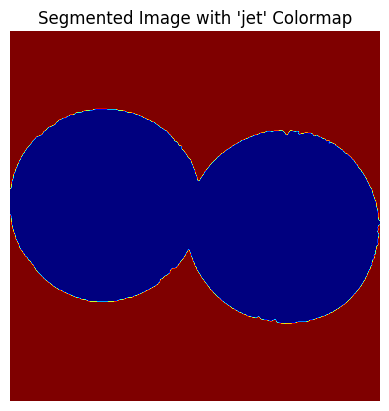

Unique intensities and counts in segmented image: {64: 601860, 128: 838140}


True

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR)
image_bgr = cv2.imread("/kaggle/input/otsudataset/basket_balls.bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R,G,B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B)
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j)
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalized histogram (length 256) and a target number of regions N,
    return the thresholds that minimise the total within-class variance,
    along with the within-group variances.
    
    For N=2, returns a single threshold and variances for two regions.
    For N=3, returns two thresholds and variances for three regions.
    For N=4, returns three thresholds and variances for four regions.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    best_within_vars = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
                best_within_vars = (v1, v2)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
                    best_within_vars = (v1, v2, v3)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
                        best_within_vars = (v1, v2, v3, v4)
    
    return best_thresholds, min_variance, best_within_vars

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalise the histogram.
      3. Display and save the histogram.
      4. Apply multi-threshold Otsu segmentation.
      5. Print optimal thresholds, within-group variances and final total variance.
      6. Return the segmented image.
    """
    grey_image = convert_to_greyscale(rgb_image)
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)
    
    # Display and save the histogram
    # plt.figure()
    # plt.bar(range(256), hist, color='gray')
    # plt.title("Histogram of the Greyscale Image")
    # plt.xlabel("Intensity")
    # plt.ylabel("Frequency")
    # plt.savefig("data13-histogram.bmp")
    # plt.show()



    # Display and save the histogram
    plt.figure()
    plt.bar(range(256), norm_hist, color='gray')
    plt.title("Histogram of the Greyscale Image")
    plt.xlabel("Intensity")
    plt.ylabel("Frequency")
    # Save as a temporary PNG file
    plt.savefig("temp_histogram.png")
    plt.show()
    
    # Convert the saved PNG to BMP using OpenCV
    temp_hist = cv2.imread("temp_histogram.png")
    cv2.imwrite("data13-histogram.bmp", temp_hist)



    
    
    thresholds, final_var, within_group_vars = otsu_multi_threshold(norm_hist, N)
    print(f"Optimal thresholds for N={N}:", thresholds)
    print("Within-group variances:", within_group_vars)
    print("Final total variance:", final_var)

    
    
    
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)
    return segmented_image

# ------------------------------
# PART 3: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 2

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert segmented (a 2D list) to a NumPy array for display/analysis
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Display using a discrete colormap.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])
plt.figure()
plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Display using a continuous colormap like 'jet'.
plt.figure()
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))

# Save the segmented image in BMP format with the required naming convention.
cv2.imwrite("data13-out.bmp", segmented_np)


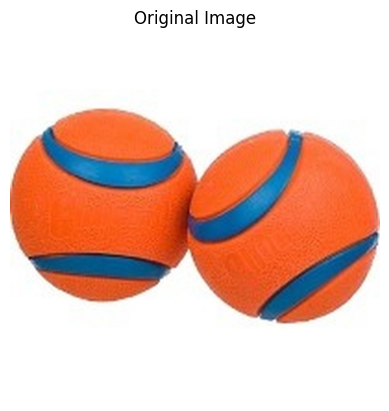

Optimal thresholds for N=4: (99, 133, 199)
Within-group variances: (192.41437130862053, 69.35895232344896, 100.39076712742173, 17.860184646893533)
Final total variance: 55.608803944216966


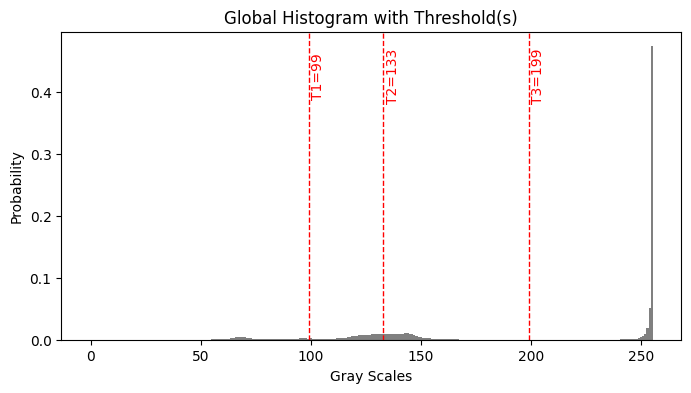

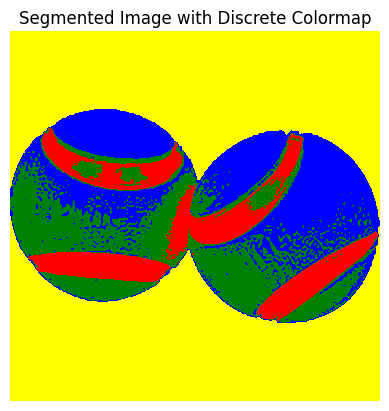

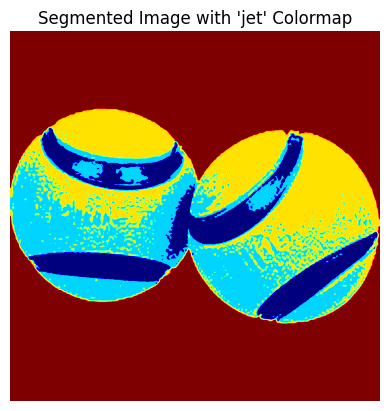

Unique intensities and counts in segmented image: {64: 126775, 128: 232355, 192: 245520, 255: 835350}


True

In [4]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR).
image_bgr = cv2.imread("/kaggle/input/otsudataset/basket_balls.bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display in Matplotlib.
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image.
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples for consistency.
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R, G, B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B).
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j),
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        # h_g is the probability of intensity g in this subrange
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalised histogram (length 256) and a target number of regions N,
    return the thresholds that minimise the total within-class variance,
    along with the within-group variances.

    For N=2, returns a single threshold and variances for two regions.
    For N=3, returns two thresholds and variances for three regions.
    For N=4, returns three thresholds and variances for four regions.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    best_within_vars = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
                best_within_vars = (v1, v2)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
                    best_within_vars = (v1, v2, v3)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
                        best_within_vars = (v1, v2, v3, v4)
    
    return best_thresholds, min_variance, best_within_vars

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def plot_probability_histogram_with_thresholds(norm_hist, thresholds):
    """
    Plot the probability histogram of the greyscale image (i.e., normalised histogram),
    and overlay vertical dashed lines for each threshold in 'thresholds'.
    """
    plt.figure(figsize=(8, 4))  # Adjust as needed

    # 1. Plot the probability histogram
    plt.bar(range(256), norm_hist, color='gray', width=1.0)

    # 2. Overlay vertical dashed lines for each threshold
    if thresholds is not None:
        for idx, t in enumerate(thresholds, start=1):
            plt.axvline(x=t, color='red', linestyle='--', linewidth=1)
            plt.text(
                t + 1,                         # a small offset on the x-axis
                max(norm_hist) * 0.9,         # near the top of the histogram
                f"T{idx}={t}",
                rotation=90,
                color='red',
                verticalalignment='center'
            )

    # 3. Set labels and title
    plt.title("Global Histogram with Threshold(s)")
    plt.xlabel("Gray Scales")
    plt.ylabel("Probability")

    # 4. Show or save
    plt.show()

# ------------------------------
# PART 3: Main Demo Function
# ------------------------------

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalise the histogram.
      3. Plot probability histogram with thresholds.
      4. Apply multi-threshold Otsu segmentation.
      5. Print optimal thresholds, within-group variances, and final total variance.
      6. Return the segmented image.
    """
    # 1. Convert to greyscale
    grey_image = convert_to_greyscale(rgb_image)

    # 2. Compute and normalise the histogram
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)

    # 3. Perform multi-threshold Otsu segmentation
    thresholds, final_var, within_group_vars = otsu_multi_threshold(norm_hist, N)

    print(f"Optimal thresholds for N={N}:", thresholds)
    print("Within-group variances:", within_group_vars)
    print("Final total variance:", final_var)

    # 4. Plot the probability histogram with the discovered thresholds
    plot_probability_histogram_with_thresholds(norm_hist, thresholds)

    # 5. Apply thresholds to the image
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)

    return segmented_image

# ------------------------------
# PART 4: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 4

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert the segmented result (a 2D list) to a NumPy array
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Display using a discrete colormap.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours for each region.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])
plt.figure()
plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Display using a continuous colormap like 'jet'.
plt.figure()
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))

# Save the segmented image in BMP format with the required naming convention.
cv2.imwrite("data13-out.bmp", segmented_np)


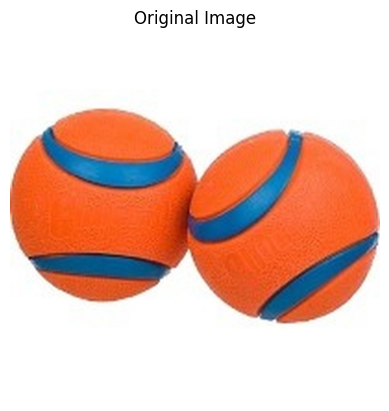

Optimal thresholds for N=3: (106, 194)
Within-group variances: (242.48684987526445, 169.8935607692426, 22.41276008756509)
Final total variance: 91.3995805037327


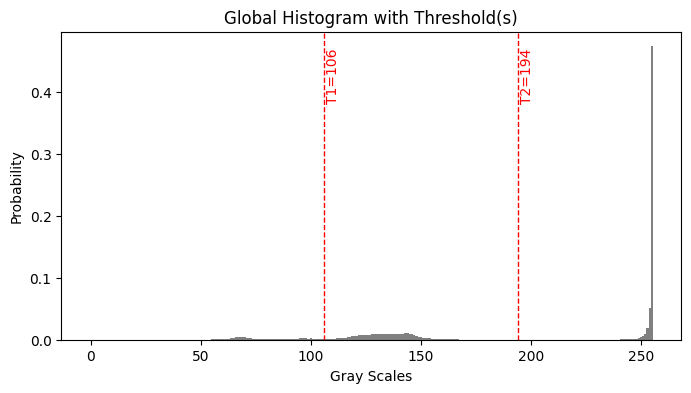

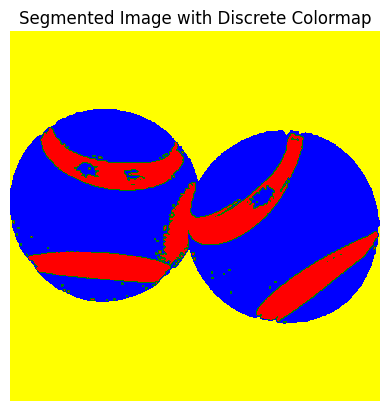

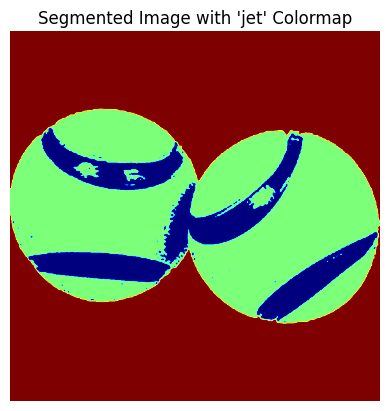

Unique intensities and counts in segmented image: {64: 142436, 128: 461040, 192: 836524}


True

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR).
image_bgr = cv2.imread("/kaggle/input/otsudataset/basket_balls.bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display in Matplotlib.
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image.
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples for consistency.
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R, G, B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B).
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j),
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        # h_g is the probability of intensity g in this subrange
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalised histogram (length 256) and a target number of regions N,
    return the thresholds that minimise the total within-class variance,
    along with the within-group variances.

    For N=2, returns a single threshold and variances for two regions.
    For N=3, returns two thresholds and variances for three regions.
    For N=4, returns three thresholds and variances for four regions.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    best_within_vars = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
                best_within_vars = (v1, v2)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
                    best_within_vars = (v1, v2, v3)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
                        best_within_vars = (v1, v2, v3, v4)
    
    return best_thresholds, min_variance, best_within_vars

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def plot_probability_histogram_with_thresholds(norm_hist, thresholds):
    """
    Plot the probability histogram of the greyscale image (i.e., normalised histogram),
    and overlay vertical dashed lines for each threshold in 'thresholds'.
    """
    plt.figure(figsize=(8, 4))  # Adjust as needed

    # 1. Plot the probability histogram
    plt.bar(range(256), norm_hist, color='gray', width=1.0)

    # 2. Overlay vertical dashed lines for each threshold
    if thresholds is not None:
        for idx, t in enumerate(thresholds, start=1):
            plt.axvline(x=t, color='red', linestyle='--', linewidth=1)
            plt.text(
                t + 1,                         # a small offset on the x-axis
                max(norm_hist) * 0.9,         # near the top of the histogram
                f"T{idx}={t}",
                rotation=90,
                color='red',
                verticalalignment='center'
            )

    # 3. Set labels and title
    plt.title("Global Histogram with Threshold(s)")
    plt.xlabel("Gray Scales")
    plt.ylabel("Probability")

    # 4. Show or save
    plt.show()

# ------------------------------
# PART 3: Main Demo Function
# ------------------------------

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalise the histogram.
      3. Plot probability histogram with thresholds.
      4. Apply multi-threshold Otsu segmentation.
      5. Print optimal thresholds, within-group variances, and final total variance.
      6. Return the segmented image.
    """
    # 1. Convert to greyscale
    grey_image = convert_to_greyscale(rgb_image)

    # 2. Compute and normalise the histogram
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)

    # 3. Perform multi-threshold Otsu segmentation
    thresholds, final_var, within_group_vars = otsu_multi_threshold(norm_hist, N)

    print(f"Optimal thresholds for N={N}:", thresholds)
    print("Within-group variances:", within_group_vars)
    print("Final total variance:", final_var)

    # 4. Plot the probability histogram with the discovered thresholds
    plot_probability_histogram_with_thresholds(norm_hist, thresholds)

    # 5. Apply thresholds to the image
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)

    return segmented_image

# ------------------------------
# PART 4: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 3

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert the segmented result (a 2D list) to a NumPy array
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Display using a discrete colormap.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours for each region.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])
plt.figure()
plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Display using a continuous colormap like 'jet'.
plt.figure()
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))

# Save the segmented image in BMP format with the required naming convention.
cv2.imwrite("data13-out.bmp", segmented_np)


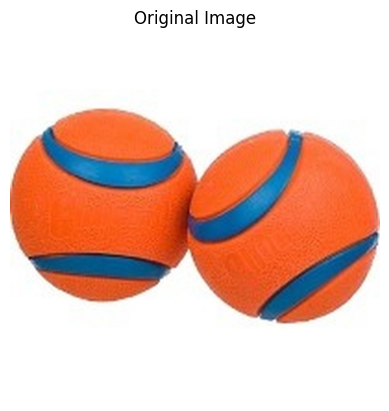

Optimal thresholds for N=2: (187,)
Within-group variances: (742.2857629900019, 30.055614873143995)
Final total variance: 327.73814052981896


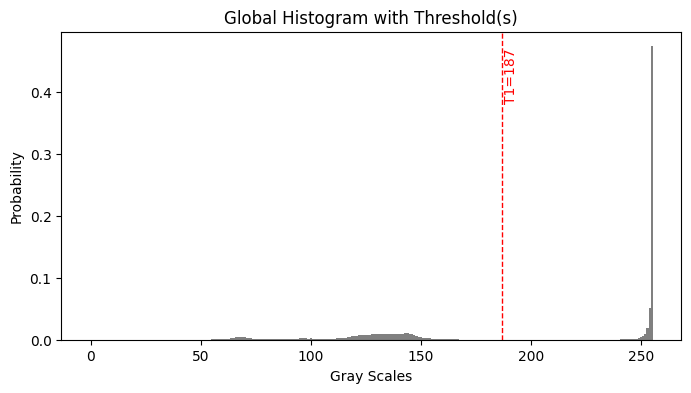

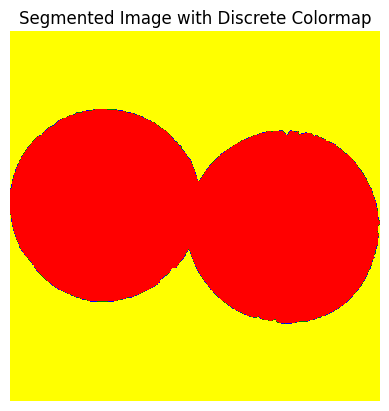

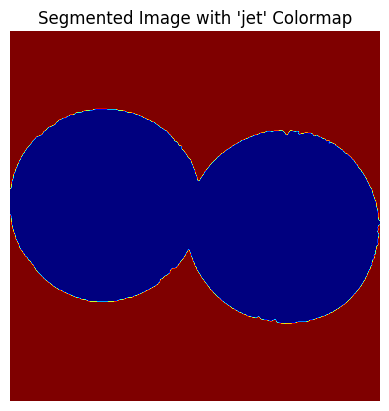

Unique intensities and counts in segmented image: {64: 601860, 128: 838140}


True

In [2]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR).
image_bgr = cv2.imread("/kaggle/input/otsudataset/basket_balls.bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display in Matplotlib.
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image.
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples for consistency.
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R, G, B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B).
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j),
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        # h_g is the probability of intensity g in this subrange
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalised histogram (length 256) and a target number of regions N,
    return the thresholds that minimise the total within-class variance,
    along with the within-group variances.

    For N=2, returns a single threshold and variances for two regions.
    For N=3, returns two thresholds and variances for three regions.
    For N=4, returns three thresholds and variances for four regions.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    best_within_vars = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
                best_within_vars = (v1, v2)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
                    best_within_vars = (v1, v2, v3)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
                        best_within_vars = (v1, v2, v3, v4)
    
    return best_thresholds, min_variance, best_within_vars

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def plot_probability_histogram_with_thresholds(norm_hist, thresholds):
    """
    Plot the probability histogram of the greyscale image (i.e., normalised histogram),
    and overlay vertical dashed lines for each threshold in 'thresholds'.
    """
    plt.figure(figsize=(8, 4))  # Adjust as needed

    # 1. Plot the probability histogram
    plt.bar(range(256), norm_hist, color='gray', width=1.0)

    # 2. Overlay vertical dashed lines for each threshold
    if thresholds is not None:
        for idx, t in enumerate(thresholds, start=1):
            plt.axvline(x=t, color='red', linestyle='--', linewidth=1)
            plt.text(
                t + 1,                         # a small offset on the x-axis
                max(norm_hist) * 0.9,         # near the top of the histogram
                f"T{idx}={t}",
                rotation=90,
                color='red',
                verticalalignment='center'
            )

    # 3. Set labels and title
    plt.title("Global Histogram with Threshold(s)")
    plt.xlabel("Gray Scales")
    plt.ylabel("Probability")

    # 4. Show or save
    plt.show()

# ------------------------------
# PART 3: Main Demo Function
# ------------------------------

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalise the histogram.
      3. Plot probability histogram with thresholds.
      4. Apply multi-threshold Otsu segmentation.
      5. Print optimal thresholds, within-group variances, and final total variance.
      6. Return the segmented image.
    """
    # 1. Convert to greyscale
    grey_image = convert_to_greyscale(rgb_image)

    # 2. Compute and normalise the histogram
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)

    # 3. Perform multi-threshold Otsu segmentation
    thresholds, final_var, within_group_vars = otsu_multi_threshold(norm_hist, N)

    print(f"Optimal thresholds for N={N}:", thresholds)
    print("Within-group variances:", within_group_vars)
    print("Final total variance:", final_var)

    # 4. Plot the probability histogram with the discovered thresholds
    plot_probability_histogram_with_thresholds(norm_hist, thresholds)

    # 5. Apply thresholds to the image
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)

    return segmented_image

# ------------------------------
# PART 4: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 2

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert the segmented result (a 2D list) to a NumPy array
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Display using a discrete colormap.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours for each region.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])
plt.figure()
plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Display using a continuous colormap like 'jet'.
plt.figure()
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))

# Save the segmented image in BMP format with the required naming convention.
cv2.imwrite("data13-out.bmp", segmented_np)


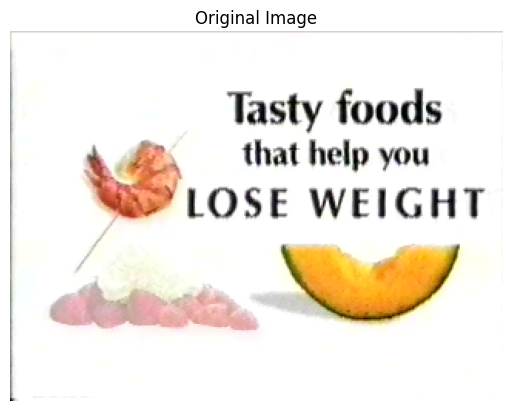

Optimal thresholds for N=4: (76, 154, 221)
Within-group variances: (533.7761499167899, 544.6562993043917, 256.41354796086443, 18.047303563053326)
Final total variance: 82.61031549127041


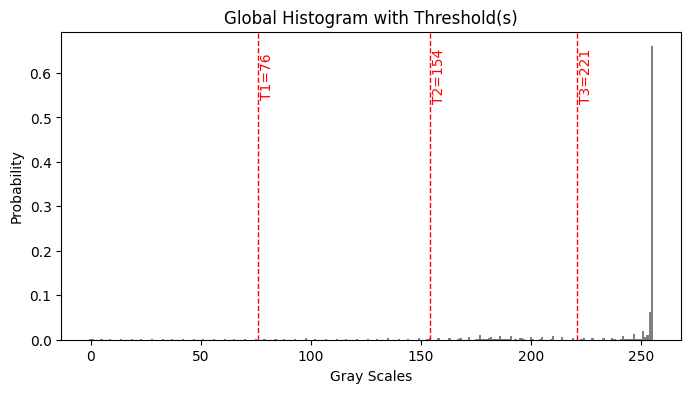

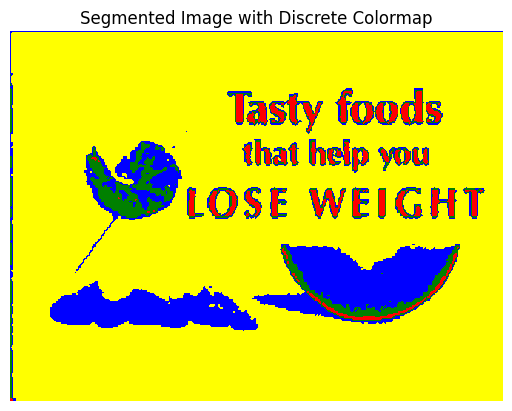

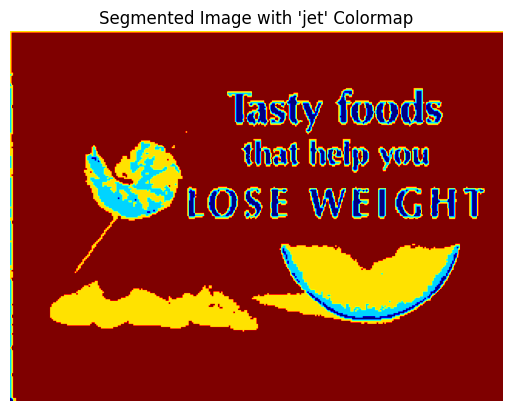

Unique intensities and counts in segmented image: {64: 2080, 128: 3233, 192: 9159, 255: 62328}


True

In [3]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR).
image_bgr = cv2.imread("/kaggle/input/otsudataset/data13 (1).bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display in Matplotlib.
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image.
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples for consistency.
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R, G, B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B).
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j),
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        # h_g is the probability of intensity g in this subrange
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalised histogram (length 256) and a target number of regions N,
    return the thresholds that minimise the total within-class variance,
    along with the within-group variances.

    For N=2, returns a single threshold and variances for two regions.
    For N=3, returns two thresholds and variances for three regions.
    For N=4, returns three thresholds and variances for four regions.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    best_within_vars = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
                best_within_vars = (v1, v2)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
                    best_within_vars = (v1, v2, v3)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
                        best_within_vars = (v1, v2, v3, v4)
    
    return best_thresholds, min_variance, best_within_vars

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def plot_probability_histogram_with_thresholds(norm_hist, thresholds):
    """
    Plot the probability histogram of the greyscale image (i.e., normalised histogram),
    and overlay vertical dashed lines for each threshold in 'thresholds'.
    """
    plt.figure(figsize=(8, 4))  # Adjust as needed

    # 1. Plot the probability histogram
    plt.bar(range(256), norm_hist, color='gray', width=1.0)

    # 2. Overlay vertical dashed lines for each threshold
    if thresholds is not None:
        for idx, t in enumerate(thresholds, start=1):
            plt.axvline(x=t, color='red', linestyle='--', linewidth=1)
            plt.text(
                t + 1,                         # a small offset on the x-axis
                max(norm_hist) * 0.9,         # near the top of the histogram
                f"T{idx}={t}",
                rotation=90,
                color='red',
                verticalalignment='center'
            )

    # 3. Set labels and title
    plt.title("Global Histogram with Threshold(s)")
    plt.xlabel("Gray Scales")
    plt.ylabel("Probability")

    # 4. Show or save
    plt.show()

# ------------------------------
# PART 3: Main Demo Function
# ------------------------------

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalise the histogram.
      3. Plot probability histogram with thresholds.
      4. Apply multi-threshold Otsu segmentation.
      5. Print optimal thresholds, within-group variances, and final total variance.
      6. Return the segmented image.
    """
    # 1. Convert to greyscale
    grey_image = convert_to_greyscale(rgb_image)

    # 2. Compute and normalise the histogram
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)

    # 3. Perform multi-threshold Otsu segmentation
    thresholds, final_var, within_group_vars = otsu_multi_threshold(norm_hist, N)

    print(f"Optimal thresholds for N={N}:", thresholds)
    print("Within-group variances:", within_group_vars)
    print("Final total variance:", final_var)

    # 4. Plot the probability histogram with the discovered thresholds
    plot_probability_histogram_with_thresholds(norm_hist, thresholds)

    # 5. Apply thresholds to the image
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)

    return segmented_image

# ------------------------------
# PART 4: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 4

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert the segmented result (a 2D list) to a NumPy array
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Display using a discrete colormap.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours for each region.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])
plt.figure()
plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Display using a continuous colormap like 'jet'.
plt.figure()
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))

# Save the segmented image in BMP format with the required naming convention.
cv2.imwrite("data13-out.bmp", segmented_np)


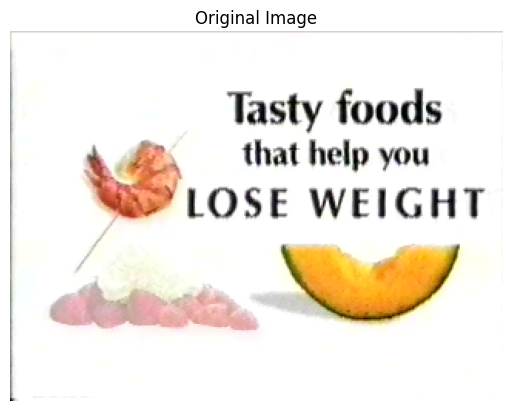

Optimal thresholds for N=3: (119, 216)
Within-group variances: (1369.6422709227709, 541.9420377553428, 24.5790820931552)
Final total variance: 157.3908449719775


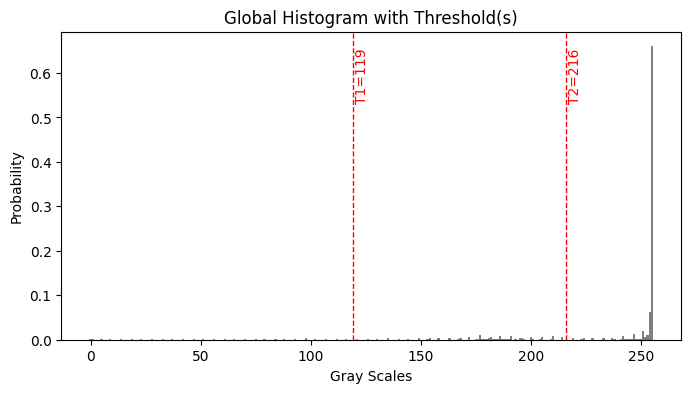

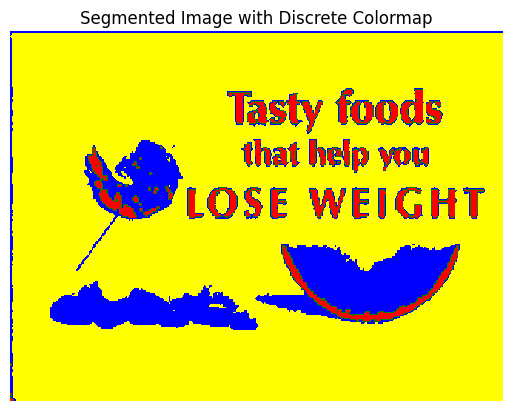

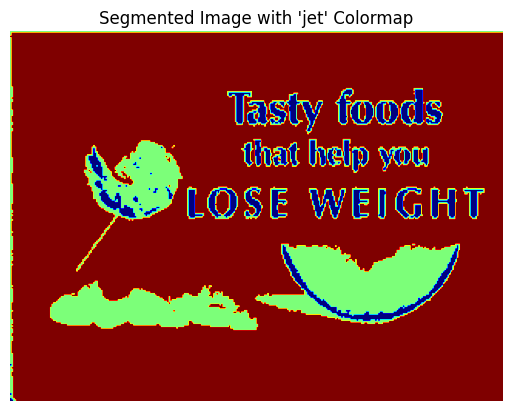

Unique intensities and counts in segmented image: {64: 3493, 128: 10634, 192: 62673}


True

In [4]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR).
image_bgr = cv2.imread("/kaggle/input/otsudataset/data13 (1).bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display in Matplotlib.
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image.
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples for consistency.
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R, G, B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B).
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j),
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        # h_g is the probability of intensity g in this subrange
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalised histogram (length 256) and a target number of regions N,
    return the thresholds that minimise the total within-class variance,
    along with the within-group variances.

    For N=2, returns a single threshold and variances for two regions.
    For N=3, returns two thresholds and variances for three regions.
    For N=4, returns three thresholds and variances for four regions.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    best_within_vars = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
                best_within_vars = (v1, v2)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
                    best_within_vars = (v1, v2, v3)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
                        best_within_vars = (v1, v2, v3, v4)
    
    return best_thresholds, min_variance, best_within_vars

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def plot_probability_histogram_with_thresholds(norm_hist, thresholds):
    """
    Plot the probability histogram of the greyscale image (i.e., normalised histogram),
    and overlay vertical dashed lines for each threshold in 'thresholds'.
    """
    plt.figure(figsize=(8, 4))  # Adjust as needed

    # 1. Plot the probability histogram
    plt.bar(range(256), norm_hist, color='gray', width=1.0)

    # 2. Overlay vertical dashed lines for each threshold
    if thresholds is not None:
        for idx, t in enumerate(thresholds, start=1):
            plt.axvline(x=t, color='red', linestyle='--', linewidth=1)
            plt.text(
                t + 1,                         # a small offset on the x-axis
                max(norm_hist) * 0.9,         # near the top of the histogram
                f"T{idx}={t}",
                rotation=90,
                color='red',
                verticalalignment='center'
            )

    # 3. Set labels and title
    plt.title("Global Histogram with Threshold(s)")
    plt.xlabel("Gray Scales")
    plt.ylabel("Probability")

    # 4. Show or save
    plt.show()

# ------------------------------
# PART 3: Main Demo Function
# ------------------------------

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalise the histogram.
      3. Plot probability histogram with thresholds.
      4. Apply multi-threshold Otsu segmentation.
      5. Print optimal thresholds, within-group variances, and final total variance.
      6. Return the segmented image.
    """
    # 1. Convert to greyscale
    grey_image = convert_to_greyscale(rgb_image)

    # 2. Compute and normalise the histogram
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)

    # 3. Perform multi-threshold Otsu segmentation
    thresholds, final_var, within_group_vars = otsu_multi_threshold(norm_hist, N)

    print(f"Optimal thresholds for N={N}:", thresholds)
    print("Within-group variances:", within_group_vars)
    print("Final total variance:", final_var)

    # 4. Plot the probability histogram with the discovered thresholds
    plot_probability_histogram_with_thresholds(norm_hist, thresholds)

    # 5. Apply thresholds to the image
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)

    return segmented_image

# ------------------------------
# PART 4: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 3

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert the segmented result (a 2D list) to a NumPy array
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Display using a discrete colormap.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours for each region.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])
plt.figure()
plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Display using a continuous colormap like 'jet'.
plt.figure()
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))

# Save the segmented image in BMP format with the required naming convention.
cv2.imwrite("data13-out.bmp", segmented_np)


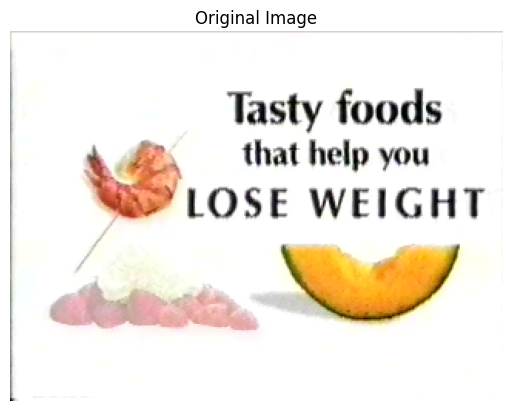

Optimal thresholds for N=2: (192,)
Within-group variances: (3285.22362054694, 138.1840710607791)
Final total variance: 583.9327197497174


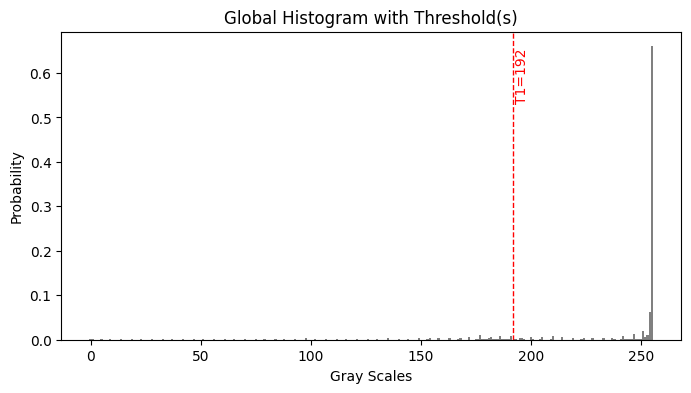

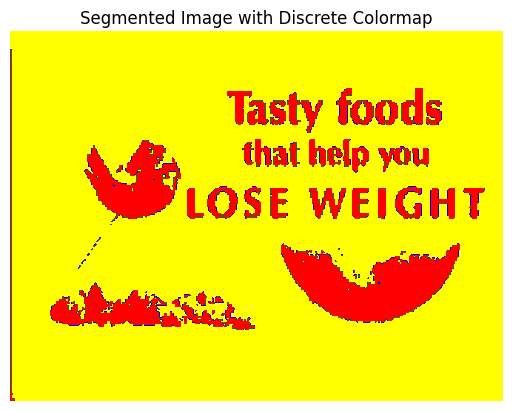

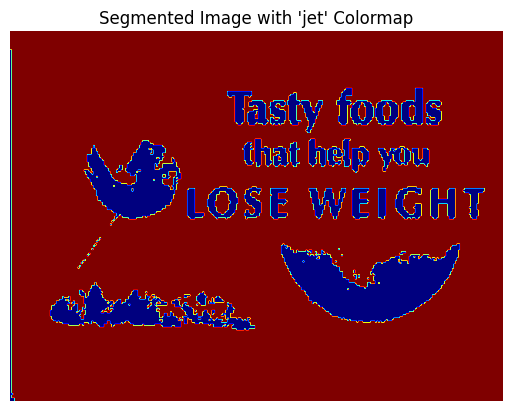

Unique intensities and counts in segmented image: {64: 10878, 128: 65922}


True

In [5]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR).
image_bgr = cv2.imread("/kaggle/input/otsudataset/data13 (1).bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display in Matplotlib.
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image.
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples for consistency.
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R, G, B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B).
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j),
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        # h_g is the probability of intensity g in this subrange
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalised histogram (length 256) and a target number of regions N,
    return the thresholds that minimise the total within-class variance,
    along with the within-group variances.

    For N=2, returns a single threshold and variances for two regions.
    For N=3, returns two thresholds and variances for three regions.
    For N=4, returns three thresholds and variances for four regions.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    best_within_vars = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
                best_within_vars = (v1, v2)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
                    best_within_vars = (v1, v2, v3)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
                        best_within_vars = (v1, v2, v3, v4)
    
    return best_thresholds, min_variance, best_within_vars

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def plot_probability_histogram_with_thresholds(norm_hist, thresholds):
    """
    Plot the probability histogram of the greyscale image (i.e., normalised histogram),
    and overlay vertical dashed lines for each threshold in 'thresholds'.
    """
    plt.figure(figsize=(8, 4))  # Adjust as needed

    # 1. Plot the probability histogram
    plt.bar(range(256), norm_hist, color='gray', width=1.0)

    # 2. Overlay vertical dashed lines for each threshold
    if thresholds is not None:
        for idx, t in enumerate(thresholds, start=1):
            plt.axvline(x=t, color='red', linestyle='--', linewidth=1)
            plt.text(
                t + 1,                         # a small offset on the x-axis
                max(norm_hist) * 0.9,         # near the top of the histogram
                f"T{idx}={t}",
                rotation=90,
                color='red',
                verticalalignment='center'
            )

    # 3. Set labels and title
    plt.title("Global Histogram with Threshold(s)")
    plt.xlabel("Gray Scales")
    plt.ylabel("Probability")

    # 4. Show or save
    plt.show()

# ------------------------------
# PART 3: Main Demo Function
# ------------------------------

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalise the histogram.
      3. Plot probability histogram with thresholds.
      4. Apply multi-threshold Otsu segmentation.
      5. Print optimal thresholds, within-group variances, and final total variance.
      6. Return the segmented image.
    """
    # 1. Convert to greyscale
    grey_image = convert_to_greyscale(rgb_image)

    # 2. Compute and normalise the histogram
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)

    # 3. Perform multi-threshold Otsu segmentation
    thresholds, final_var, within_group_vars = otsu_multi_threshold(norm_hist, N)

    print(f"Optimal thresholds for N={N}:", thresholds)
    print("Within-group variances:", within_group_vars)
    print("Final total variance:", final_var)

    # 4. Plot the probability histogram with the discovered thresholds
    plot_probability_histogram_with_thresholds(norm_hist, thresholds)

    # 5. Apply thresholds to the image
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)

    return segmented_image

# ------------------------------
# PART 4: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 2

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert the segmented result (a 2D list) to a NumPy array
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Display using a discrete colormap.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours for each region.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])
plt.figure()
plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Display using a continuous colormap like 'jet'.
plt.figure()
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))

# Save the segmented image in BMP format with the required naming convention.
cv2.imwrite("data13-out.bmp", segmented_np)


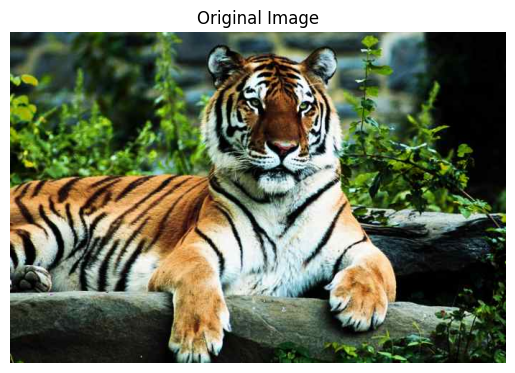

Optimal thresholds for N=4: (48, 109, 177)
Within-group variances: (215.10989944956123, 309.11566689824656, 393.76755381154777, 480.2250946640847)
Final total variance: 321.1087978231897


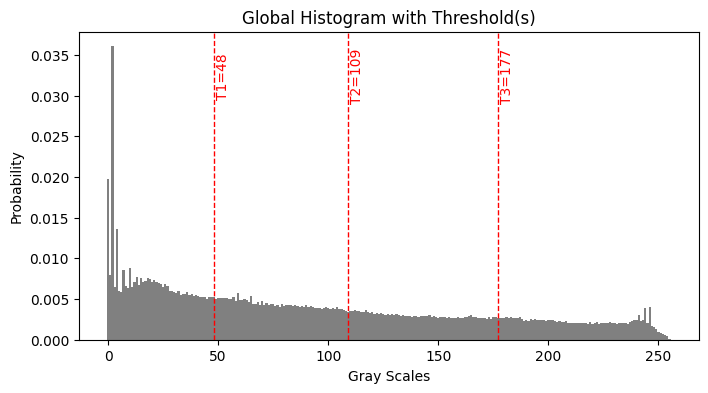

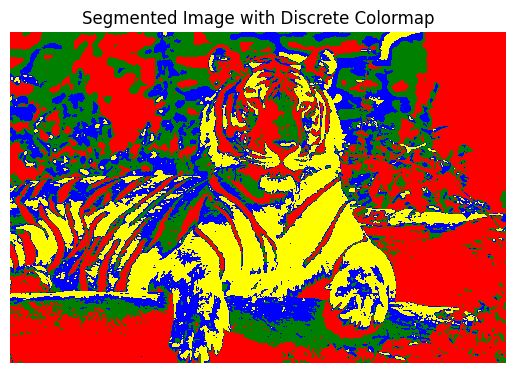

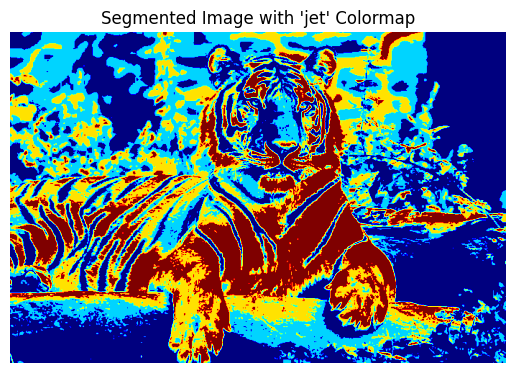

Unique intensities and counts in segmented image: {64: 115312, 128: 84696, 192: 64194, 255: 53888}


True

In [6]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR).
image_bgr = cv2.imread("/kaggle/input/otsudataset/tiger1.bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display in Matplotlib.
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image.
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples for consistency.
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R, G, B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B).
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j),
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        # h_g is the probability of intensity g in this subrange
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalised histogram (length 256) and a target number of regions N,
    return the thresholds that minimise the total within-class variance,
    along with the within-group variances.

    For N=2, returns a single threshold and variances for two regions.
    For N=3, returns two thresholds and variances for three regions.
    For N=4, returns three thresholds and variances for four regions.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    best_within_vars = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
                best_within_vars = (v1, v2)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
                    best_within_vars = (v1, v2, v3)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
                        best_within_vars = (v1, v2, v3, v4)
    
    return best_thresholds, min_variance, best_within_vars

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def plot_probability_histogram_with_thresholds(norm_hist, thresholds):
    """
    Plot the probability histogram of the greyscale image (i.e., normalised histogram),
    and overlay vertical dashed lines for each threshold in 'thresholds'.
    """
    plt.figure(figsize=(8, 4))  # Adjust as needed

    # 1. Plot the probability histogram
    plt.bar(range(256), norm_hist, color='gray', width=1.0)

    # 2. Overlay vertical dashed lines for each threshold
    if thresholds is not None:
        for idx, t in enumerate(thresholds, start=1):
            plt.axvline(x=t, color='red', linestyle='--', linewidth=1)
            plt.text(
                t + 1,                         # a small offset on the x-axis
                max(norm_hist) * 0.9,         # near the top of the histogram
                f"T{idx}={t}",
                rotation=90,
                color='red',
                verticalalignment='center'
            )

    # 3. Set labels and title
    plt.title("Global Histogram with Threshold(s)")
    plt.xlabel("Gray Scales")
    plt.ylabel("Probability")

    # 4. Show or save
    plt.show()

# ------------------------------
# PART 3: Main Demo Function
# ------------------------------

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalise the histogram.
      3. Plot probability histogram with thresholds.
      4. Apply multi-threshold Otsu segmentation.
      5. Print optimal thresholds, within-group variances, and final total variance.
      6. Return the segmented image.
    """
    # 1. Convert to greyscale
    grey_image = convert_to_greyscale(rgb_image)

    # 2. Compute and normalise the histogram
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)

    # 3. Perform multi-threshold Otsu segmentation
    thresholds, final_var, within_group_vars = otsu_multi_threshold(norm_hist, N)

    print(f"Optimal thresholds for N={N}:", thresholds)
    print("Within-group variances:", within_group_vars)
    print("Final total variance:", final_var)

    # 4. Plot the probability histogram with the discovered thresholds
    plot_probability_histogram_with_thresholds(norm_hist, thresholds)

    # 5. Apply thresholds to the image
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)

    return segmented_image

# ------------------------------
# PART 4: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 4

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert the segmented result (a 2D list) to a NumPy array
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Display using a discrete colormap.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours for each region.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])
plt.figure()
plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Display using a continuous colormap like 'jet'.
plt.figure()
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))

# Save the segmented image in BMP format with the required naming convention.
cv2.imwrite("data13-out.bmp", segmented_np)


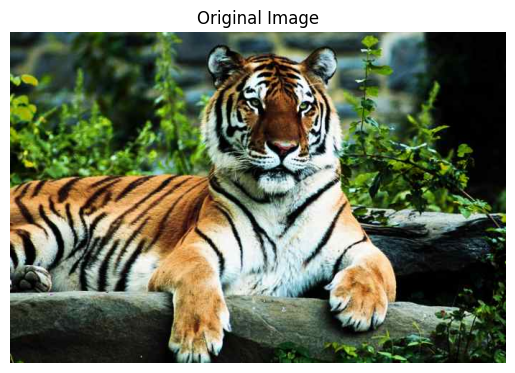

Optimal thresholds for N=3: (66, 152)
Within-group variances: (404.7243463488322, 603.2316734744205, 833.9246770580362)
Final total variance: 568.2176206291498


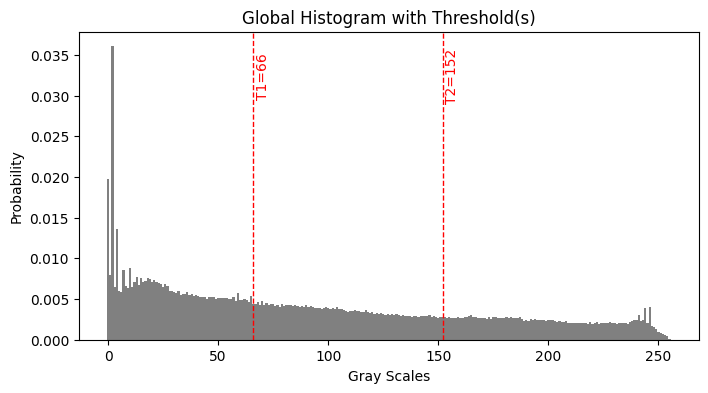

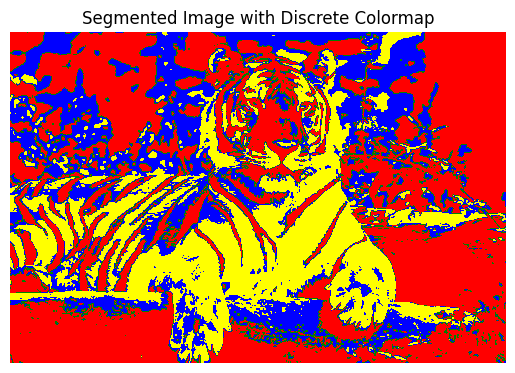

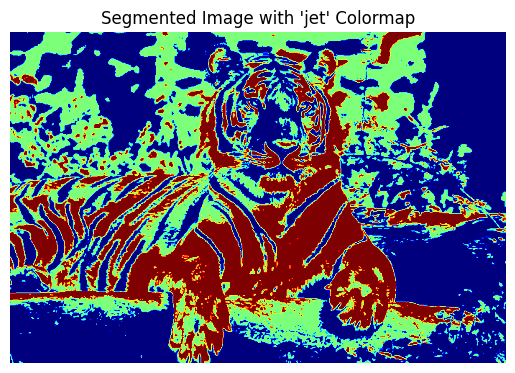

Unique intensities and counts in segmented image: {64: 144054, 128: 98359, 192: 75677}


True

In [7]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR).
image_bgr = cv2.imread("/kaggle/input/otsudataset/tiger1.bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display in Matplotlib.
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image.
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples for consistency.
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R, G, B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B).
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j),
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        # h_g is the probability of intensity g in this subrange
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalised histogram (length 256) and a target number of regions N,
    return the thresholds that minimise the total within-class variance,
    along with the within-group variances.

    For N=2, returns a single threshold and variances for two regions.
    For N=3, returns two thresholds and variances for three regions.
    For N=4, returns three thresholds and variances for four regions.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    best_within_vars = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
                best_within_vars = (v1, v2)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
                    best_within_vars = (v1, v2, v3)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
                        best_within_vars = (v1, v2, v3, v4)
    
    return best_thresholds, min_variance, best_within_vars

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def plot_probability_histogram_with_thresholds(norm_hist, thresholds):
    """
    Plot the probability histogram of the greyscale image (i.e., normalised histogram),
    and overlay vertical dashed lines for each threshold in 'thresholds'.
    """
    plt.figure(figsize=(8, 4))  # Adjust as needed

    # 1. Plot the probability histogram
    plt.bar(range(256), norm_hist, color='gray', width=1.0)

    # 2. Overlay vertical dashed lines for each threshold
    if thresholds is not None:
        for idx, t in enumerate(thresholds, start=1):
            plt.axvline(x=t, color='red', linestyle='--', linewidth=1)
            plt.text(
                t + 1,                         # a small offset on the x-axis
                max(norm_hist) * 0.9,         # near the top of the histogram
                f"T{idx}={t}",
                rotation=90,
                color='red',
                verticalalignment='center'
            )

    # 3. Set labels and title
    plt.title("Global Histogram with Threshold(s)")
    plt.xlabel("Gray Scales")
    plt.ylabel("Probability")

    # 4. Show or save
    plt.show()

# ------------------------------
# PART 3: Main Demo Function
# ------------------------------

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalise the histogram.
      3. Plot probability histogram with thresholds.
      4. Apply multi-threshold Otsu segmentation.
      5. Print optimal thresholds, within-group variances, and final total variance.
      6. Return the segmented image.
    """
    # 1. Convert to greyscale
    grey_image = convert_to_greyscale(rgb_image)

    # 2. Compute and normalise the histogram
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)

    # 3. Perform multi-threshold Otsu segmentation
    thresholds, final_var, within_group_vars = otsu_multi_threshold(norm_hist, N)

    print(f"Optimal thresholds for N={N}:", thresholds)
    print("Within-group variances:", within_group_vars)
    print("Final total variance:", final_var)

    # 4. Plot the probability histogram with the discovered thresholds
    plot_probability_histogram_with_thresholds(norm_hist, thresholds)

    # 5. Apply thresholds to the image
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)

    return segmented_image

# ------------------------------
# PART 4: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 3

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert the segmented result (a 2D list) to a NumPy array
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Display using a discrete colormap.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours for each region.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])
plt.figure()
plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Display using a continuous colormap like 'jet'.
plt.figure()
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))

# Save the segmented image in BMP format with the required naming convention.
cv2.imwrite("data13-out.bmp", segmented_np)


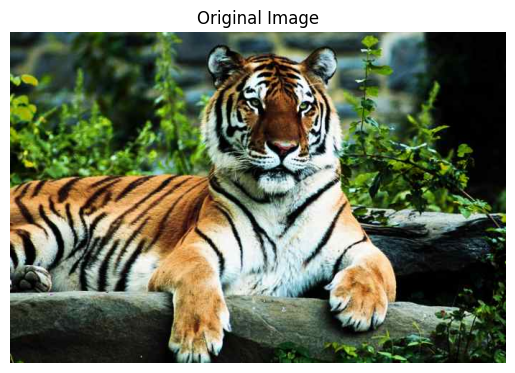

Optimal thresholds for N=2: (108,)
Within-group variances: (1042.5348616782978, 1718.1472538683336)
Final total variance: 1295.6351638032734


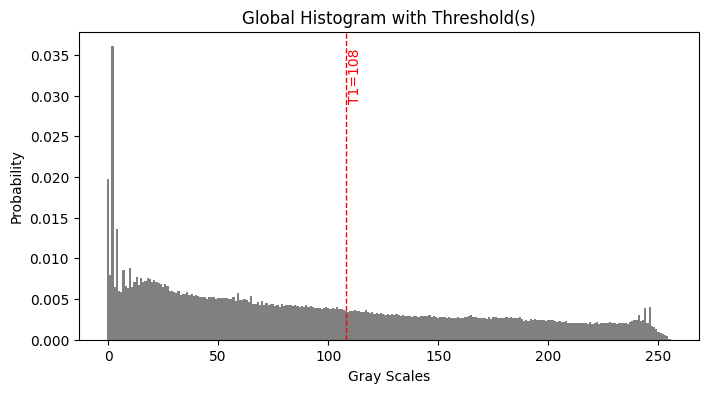

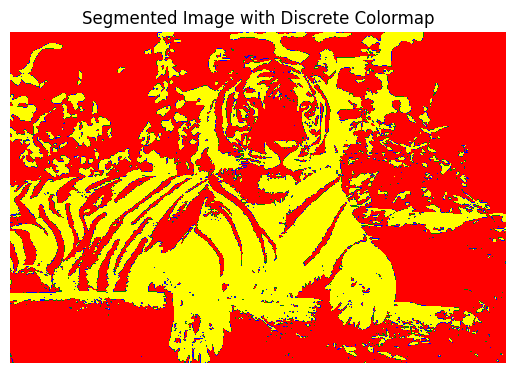

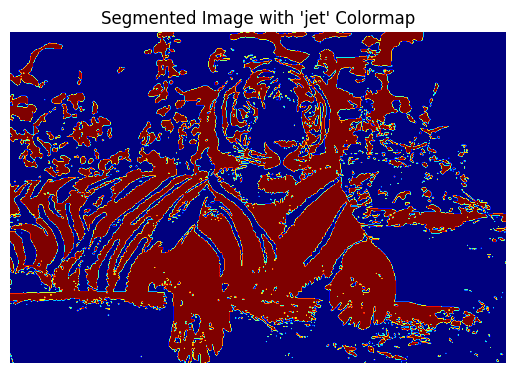

Unique intensities and counts in segmented image: {64: 198926, 128: 119164}


True

In [8]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.colors as mcolors

# ------------------------------
# PART 1: Read and Display the Original Image
# ------------------------------

# Read BMP image using OpenCV (loads as BGR).
image_bgr = cv2.imread("/kaggle/input/otsudataset/tiger1.bmp")
if image_bgr is None:
    raise FileNotFoundError("Image not found. Check the file path.")

# Convert from BGR to RGB for correct colour display in Matplotlib.
image_rgb = cv2.cvtColor(image_bgr, cv2.COLOR_BGR2RGB)

# Display the original RGB image.
plt.imshow(image_rgb)
plt.axis("off")
plt.title("Original Image")
plt.show()

# Convert the NumPy array (RGB) to a list of lists of (R, G, B) tuples for consistency.
rgb_image_list = image_rgb.tolist()

# ------------------------------
# PART 2: Multi-Threshold Otsu Segmentation Functions
# ------------------------------

def convert_to_greyscale(rgb_image):
    """
    Convert an RGB image (list of lists of (R, G, B) tuples)
    to a 2D greyscale image using:
       I = Round(0.299*R + 0.587*G + 0.114*B).
    Returns a 2D list of grey values in [0, 255].
    """
    height = len(rgb_image)
    width = len(rgb_image[0])
    grey_image = [[0] * width for _ in range(height)]
    for r in range(height):
        for c in range(width):
            red, green, blue = rgb_image[r][c]
            grey_val = int(round(0.299 * red + 0.587 * green + 0.114 * blue))
            grey_val = max(0, min(255, grey_val))
            grey_image[r][c] = grey_val
    return grey_image

def compute_histogram(grey_image):
    """
    Compute histogram of a 2D greyscale image (8-bit).
    hist[g] counts the number of pixels with grey-level g.
    Returns a list of length 256.
    """
    hist = [0] * 256
    height = len(grey_image)
    width = len(grey_image[0])
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            hist[g] += 1
    return hist

def normalise_histogram(hist):
    """
    Given a histogram 'hist', return its normalised version H(j),
    where sum_j H(j) = 1.
    """
    total_pixels = sum(hist)
    norm_hist = [h / total_pixels for h in hist]
    return norm_hist

def prepare_cumulative_arrays(norm_hist):
    """
    Prepare cumulative sums:
      P(k) = sum_{j=0}^{k} H(j)
      S(k) = sum_{j=0}^{k} j * H(j)
    for k in 0..255.
    Returns two lists P and S (each of length 256).
    """
    P = [0] * 256
    S = [0] * 256
    P[0] = norm_hist[0]
    S[0] = 0.0 * norm_hist[0]
    for k in range(1, 256):
        P[k] = P[k - 1] + norm_hist[k]
        S[k] = S[k - 1] + k * norm_hist[k]
    return P, S

def region_stats(P, S, start_g, end_g):
    """
    Compute (omega, mean, variance) for the region of grey-levels [start_g .. end_g].
    Uses cumulative arrays P and S.
    """
    if start_g == 0:
        omega = P[end_g]
        sum_intensities = S[end_g]
    else:
        omega = P[end_g] - P[start_g - 1]
        sum_intensities = S[end_g] - S[start_g - 1]
    
    if omega <= 0.0:
        return (0.0, 0.0, 0.0)
    
    mean_val = sum_intensities / omega
    var_numer = 0.0
    for g in range(start_g, end_g + 1):
        # h_g is the probability of intensity g in this subrange
        if g == 0:
            h_g = P[g]
        else:
            h_g = P[g] - P[g - 1]
        diff = g - mean_val
        var_numer += (diff * diff) * h_g
    var_val = var_numer / omega
    
    return (omega, mean_val, var_val)

def otsu_multi_threshold(norm_hist, N):
    """
    Given a normalised histogram (length 256) and a target number of regions N,
    return the thresholds that minimise the total within-class variance,
    along with the within-group variances.

    For N=2, returns a single threshold and variances for two regions.
    For N=3, returns two thresholds and variances for three regions.
    For N=4, returns three thresholds and variances for four regions.
    """
    P, S = prepare_cumulative_arrays(norm_hist)
    best_thresholds = None
    best_within_vars = None
    min_variance = float("inf")
    
    if N == 2:
        for t in range(0, 255):
            w1, m1, v1 = region_stats(P, S, 0, t)
            w2, m2, v2 = region_stats(P, S, t + 1, 255)
            total_var = w1 * v1 + w2 * v2
            if total_var < min_variance:
                min_variance = total_var
                best_thresholds = (t,)
                best_within_vars = (v1, v2)
    
    elif N == 3:
        for t1 in range(0, 254):
            for t2 in range(t1 + 1, 255):
                w1, m1, v1 = region_stats(P, S, 0, t1)
                w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                w3, m3, v3 = region_stats(P, S, t2 + 1, 255)
                total_var = w1 * v1 + w2 * v2 + w3 * v3
                if total_var < min_variance:
                    min_variance = total_var
                    best_thresholds = (t1, t2)
                    best_within_vars = (v1, v2, v3)
    
    elif N == 4:
        for t1 in range(0, 253):
            for t2 in range(t1 + 1, 254):
                for t3 in range(t2 + 1, 255):
                    w1, m1, v1 = region_stats(P, S, 0, t1)
                    w2, m2, v2 = region_stats(P, S, t1 + 1, t2)
                    w3, m3, v3 = region_stats(P, S, t2 + 1, t3)
                    w4, m4, v4 = region_stats(P, S, t3 + 1, 255)
                    total_var = w1 * v1 + w2 * v2 + w3 * v3 + w4 * v4
                    if total_var < min_variance:
                        min_variance = total_var
                        best_thresholds = (t1, t2, t3)
                        best_within_vars = (v1, v2, v3, v4)
    
    return best_thresholds, min_variance, best_within_vars

def apply_thresholds_to_image(grey_image, thresholds):
    """
    Given a 2D greyscale image and a tuple of thresholds (t1, t2, ...),
    produce a new 2D image where each region is assigned a unique intensity.
    """
    # Define output intensities for up to 4 regions.
    region_values = [64, 128, 192, 255]
    height = len(grey_image)
    width = len(grey_image[0])
    out_image = [[0] * width for _ in range(height)]
    t_list = sorted(thresholds)
    
    for r in range(height):
        for c in range(width):
            g = grey_image[r][c]
            region_idx = 0
            while region_idx < len(t_list) and g > t_list[region_idx]:
                region_idx += 1
            out_image[r][c] = region_values[region_idx]
    
    return out_image

def plot_probability_histogram_with_thresholds(norm_hist, thresholds):
    """
    Plot the probability histogram of the greyscale image (i.e., normalised histogram),
    and overlay vertical dashed lines for each threshold in 'thresholds'.
    """
    plt.figure(figsize=(8, 4))  # Adjust as needed

    # 1. Plot the probability histogram
    plt.bar(range(256), norm_hist, color='gray', width=1.0)

    # 2. Overlay vertical dashed lines for each threshold
    if thresholds is not None:
        for idx, t in enumerate(thresholds, start=1):
            plt.axvline(x=t, color='red', linestyle='--', linewidth=1)
            plt.text(
                t + 1,                         # a small offset on the x-axis
                max(norm_hist) * 0.9,         # near the top of the histogram
                f"T{idx}={t}",
                rotation=90,
                color='red',
                verticalalignment='center'
            )

    # 3. Set labels and title
    plt.title("Global Histogram with Threshold(s)")
    plt.xlabel("Gray Scales")
    plt.ylabel("Probability")

    # 4. Show or save
    plt.show()

# ------------------------------
# PART 3: Main Demo Function
# ------------------------------

def main_demo(rgb_image, N):
    """
    Full pipeline:
      1. Convert the RGB image to greyscale.
      2. Compute and normalise the histogram.
      3. Plot probability histogram with thresholds.
      4. Apply multi-threshold Otsu segmentation.
      5. Print optimal thresholds, within-group variances, and final total variance.
      6. Return the segmented image.
    """
    # 1. Convert to greyscale
    grey_image = convert_to_greyscale(rgb_image)

    # 2. Compute and normalise the histogram
    hist = compute_histogram(grey_image)
    norm_hist = normalise_histogram(hist)

    # 3. Perform multi-threshold Otsu segmentation
    thresholds, final_var, within_group_vars = otsu_multi_threshold(norm_hist, N)

    print(f"Optimal thresholds for N={N}:", thresholds)
    print("Within-group variances:", within_group_vars)
    print("Final total variance:", final_var)

    # 4. Plot the probability histogram with the discovered thresholds
    plot_probability_histogram_with_thresholds(norm_hist, thresholds)

    # 5. Apply thresholds to the image
    segmented_image = apply_thresholds_to_image(grey_image, thresholds)

    return segmented_image

# ------------------------------
# PART 4: Run the Segmentation and Display the Result
# ------------------------------

# Choose the number of regions (e.g., 2, 3, or 4)
N = 2

# Run the full segmentation demo
segmented = main_demo(rgb_image_list, N)

# Convert the segmented result (a 2D list) to a NumPy array
segmented_np = np.array(segmented, dtype=np.uint8)

# Option 1: Display using a discrete colormap.
# Map the intensities {64, 128, 192, 255} to indices {0, 1, 2, 3}.
mapping = {64: 0, 128: 1, 192: 2, 255: 3}
segmented_mapped = np.vectorize(mapping.get)(segmented_np)

# Define a discrete colormap with distinct colours for each region.
cmap = mcolors.ListedColormap(["red", "green", "blue", "yellow"])
plt.figure()
plt.imshow(segmented_mapped, cmap=cmap)
plt.axis("off")
plt.title("Segmented Image with Discrete Colormap")
plt.show()

# Option 2: Display using a continuous colormap like 'jet'.
plt.figure()
plt.imshow(segmented_np, cmap="jet")
plt.axis("off")
plt.title("Segmented Image with 'jet' Colormap")
plt.show()

# Verify segmentation by printing unique intensity values.
unique, counts = np.unique(segmented_np, return_counts=True)
print("Unique intensities and counts in segmented image:", dict(zip(unique, counts)))

# Save the segmented image in BMP format with the required naming convention.
cv2.imwrite("data13-out.bmp", segmented_np)
